# Conspiracy Theory Notebook

Exploration of COVID 19 Twitter dataset: https://github.com/echen102/COVID-19-TweetIDs

## Importing Data

In [1]:
import pandas as pd
import numpy as np
import json
import jsonlines
import os
from os import path
from PIL import Image
from tqdm.auto import tqdm as tqdm
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from os import listdir
from os.path import isfile, join
from collections import Counter
from nltk import ngrams
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import re
import ast
import warnings
warnings.filterwarnings("ignore")

### Sampling to reduce dataset size

Not required if using preprocessed data

In [2]:
# Files downloaded from Emily's dataset
filepath = 'coronavirus-clean/'
months = ['2020-01/','2020-02/','2020-03/','2020-04/','2020-05/']

In [3]:
# List the csv files in the directories
csv_files = []
files = []
files = [f for f in os.listdir(filepath) if not f.startswith('.')]
for month in months:
    csv_files  += [filepath+month + f for f in listdir(filepath+month) if isfile(join(filepath+month, f)) and not f.startswith('.') and f[-3:] == 'csv']
csv_files = sorted(csv_files)
len(csv_files)

2385

In [4]:
# Timestamps of the csvs
csv_timestamps  = []
for i in range(len(csv_files)):
    csv_timestamps.append(pd.Timestamp(csv_files[i][-17:-4]))

In [5]:
# Sampling 

# Sample 1 in every 13 files
dates = []
hours = []
sample_every = 1

print('No. files:', len(csv_timestamps[::sample_every]))
sample_files =  csv_files[::sample_every]

for i in range(len(csv_timestamps[::sample_every])):
    dates.append(csv_timestamps[::sample_every][i].day)
    hours.append(csv_timestamps[::sample_every][i].hour)

No. files: 2385


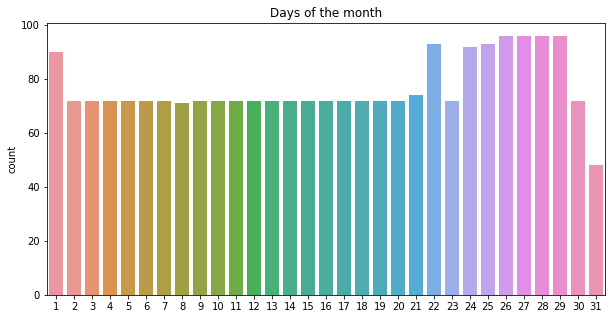

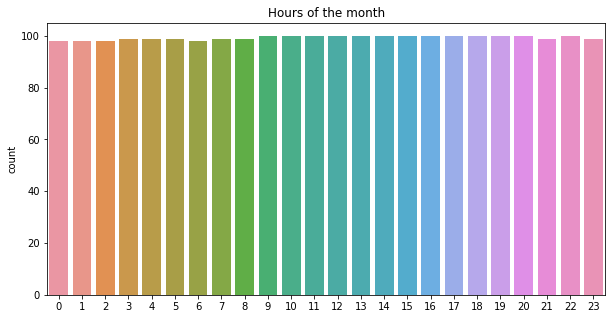

In [6]:
# Make sure the samples have an even number of days in the month and the hours
plt.figure(figsize = (10,5))
plt.title('Days of the month')
sns.countplot(dates)
plt.show()

plt.figure(figsize = (10,5))
plt.title('Hours of the month')
sns.countplot(hours)
plt.show()

# Conspiracy theory analysis

In [7]:
def create_cloud(string,exclude = None):
    wordcloud = WordCloud(width=800,height=400,max_font_size=50, max_words=100,
                      collocations=False, background_color="white", stopwords = exclude
                     ).generate(string)

    # Display the generated image:
    plt.figure(figsize = (20,20))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [8]:
# Find hashtags for tweets
def hash_tweets(string,df):
    tweets = df[df.hashtag.str.contains(string)]
    return tweets

In [9]:
# Find text for tweets
def text_tweets(string,df):
    tweets = df[df.text.str.contains(string)]
    return tweets

In [10]:
# Find urls for tweets
def url_tweets(string,df):
    tweets = df[df.urls_list.str.contains(string)]
    return tweets

In [11]:
# Get tweets, create a cloud, get users associated with each url substring
def get_hashtags_tweets(df,hashtag_list,cloud=True):
    users = set()
    hash_dict = {}
    hash_df = pd.DataFrame()

    for hashtag in hashtag_list:
        these_hashtags = hash_tweets(hashtag,df)
        hash_df = hash_df.append(these_hashtags)
        hash_dict[hashtag] = these_hashtags.screen_name.unique()
        these_users = list(these_hashtags.screen_name.unique())
        users.update(these_users)
        if cloud:
            related_hashs = ' '.join(these_hashtags.hashtag)
            create_cloud(related_hashs,exclude = [hashtag,'coronavirus','covid19'])
            print(hashtag,len(these_users))
    
    return list(users), hash_dict, hash_df

In [12]:
# Get tweets, create a cloud, get users associated with each url substring
def get_url_usertweets(df,url_list):
    users = set()
    url_dict = {}
    url_df = pd.DataFrame()

    for url in url_list:
        these_urls = url_tweets(url,df)
        url_df = url_df.append(these_urls)
        url_dict[url] = these_urls.screen_name.unique()
        users.update(list(these_urls.screen_name.unique()))
    
    return list(users), url_dict, url_df

In [13]:
# Get tweets, create a cloud, get users associated with each url substring
def get_text_tweets(df,text_list):
    users = []
    text_dict = {}
    text_df = pd.DataFrame()

    for text in text_list:
        these_keyword = text_tweets(text,df)
        text_df = text_df.append(these_keyword)
        text_dict[text] = these_keyword.screen_name.unique()
        users += list(these_keyword.screen_name.unique())
    
    return users, text_dict, text_df

In [14]:
def unique(list1): 
    x = np.array(list1) 
    return np.unique(x)

In [16]:
""" Tweet Columns
       'tweetid', 'userid', 'screen_name', 'date', 'lang', 'location',
       'place_id', 'place_url', 'place_type', 'place_name', 'place_full_name',
       'place_country_code', 'place_country', 'place_bounding_box', 'text',
       'extended', 'coord', 'reply_userid', 'reply_screen', 'reply_statusid',
       'tweet_type', 'friends_count', 'listed_count', 'followers_count',
       'favourites_count', 'statuses_count', 'verified', 'hashtag',
       'urls_list', 'profile_pic_url', 'profile_banner_url', 'display_name',
       'date_first_tweet', 'account_creation_date', 'rt_urls_list',
       'mentionid', 'mentionsn', 'rt_screen', 'rt_userid', 'rt_text',
       'rt_hashtag', 'rt_qtd_count', 'rt_rt_count', 'rt_reply_count',
       'rt_fav_count', 'rt_tweetid', 'qtd_screen', 'qtd_userid', 'qtd_text',
       'qtd_hashtag', 'qtd_qtd_count', 'qtd_rt_count', 'qtd_reply_count',
       'qtd_fav_count', 'qtd_tweetid', 'qtd_urls_list'                         """

" Columns\n       'tweetid', 'userid', 'screen_name', 'date', 'lang', 'location',\n       'place_id', 'place_url', 'place_type', 'place_name', 'place_full_name',\n       'place_country_code', 'place_country', 'place_bounding_box', 'text',\n       'extended', 'coord', 'reply_userid', 'reply_screen', 'reply_statusid',\n       'tweet_type', 'friends_count', 'listed_count', 'followers_count',\n       'favourites_count', 'statuses_count', 'verified', 'hashtag',\n       'urls_list', 'profile_pic_url', 'profile_banner_url', 'display_name',\n       'date_first_tweet', 'account_creation_date', 'rt_urls_list',\n       'mentionid', 'mentionsn', 'rt_screen', 'rt_userid', 'rt_text',\n       'rt_hashtag', 'rt_qtd_count', 'rt_rt_count', 'rt_reply_count',\n       'rt_fav_count', 'rt_tweetid', 'qtd_screen', 'qtd_userid', 'qtd_text',\n       'qtd_hashtag', 'qtd_qtd_count', 'qtd_rt_count', 'qtd_reply_count',\n       'qtd_fav_count', 'qtd_tweetid', 'qtd_urls_list'                         "

In [21]:
# Conspiracy theory hashtags
keywords = ['plandemic',
            'scamdemic',
            'qanon',                # anonymous conspiracy theorist author
            'greatawakening',       # book written by qanon
            'chinaliedpeopledied',  # chinese govt lies
            '5gcoronavirus',        # 5g spreading coronavirus
            'chemtrails',           # related to 5g coronavirus spreading
            'rfid',                 # spread through rfid chips
            'bioweapon',
            'falseflag',            # covert operation to deceive
            'deepstate',
            'psyop',                # influence by psychological operations
            'policestate',          # govt control through police 
            'billgates',               
            'event201',             # pandemic exercise
            'filmyourhospital',      # filming empty hospitals
            'coronahoax'
           ]

general_keywords = ['plandemic','scamdemic','coronahoax','fakevirus']

# Polarising keywords
# Hong Kong and police and 
china_keywords = ['chinaliedpeopledied',
                  'ccpvirus',
                  'makechinapay',
                  'chinamustpay',
                  'chinaliedpeopledie',
                  'chinesebioterrorism',
                  'boycottchina',
                  'chinaisasshoe',
                  'chinavirusmadeinchina',
                  'chinazi',
                 ]

# Bill gates related
bill_keywords = ['fuckbillgates',
                 'gatesvirus',
                 'billgatesisevil',
                 'billgatesisnotourfriend',
                 'arrestbillgates',
                 'billgatesbioterrorist',
                 'billgatesisnotadoctor'
                ]
# 5g related  
fiveg_keywords = ['5gvirus',
                  '5gcoronavirus',
                  '5gkill',
                  '5gcovid19connection',
                  '5gfake',
                  '5gchemtrails',
                  'stop5g',
                  '5gconspiracy',
                  '5gmindcontrol'
                 ]

# Hospital related  
hosp_keywords = ['filmyourhospital',
                 'emptyhospital',
                ]

qanon_keywords = ['qanon',
                  'greatawakening',
                  'wwg1wga',
                  'qarmy'
                 ]

all_keywords = list(set(keywords+general_keywords+china_keywords+bill_keywords+fiveg_keywords+hosp_keywords+qanon_keywords))

In [20]:
# News url substrings to look for in tweet url lists (Try sampling)

news_sources = ['msnbc',
                'nydailynews',
                'reuters',
                'foxnews',
                'cnn',
                'wsj',
                'huffpost',
                'nyt',
                'dailymail',
                'washingtonpost',
                'theguardian',
                'abcnews',
                'bbc',
                'usatoday',
                'infowars',
                'oann',
                'latimes',
                'cnbc',
                'boston',
                'yahoo',
                'chicagotribune',
                'msn',
               ]

### Get tweets from preprocessed csvs

Used once the conspiracy theory tweets have been found and saved

In [16]:
# Preprocessed csvs with only conspiracy and url tweets

df = pd.read_csv('consp_url.csv')
df2 = pd.read_csv('consp_url_05_31.csv')
df = df.append(df2)
df.drop_duplicates(subset=['text','userid'],inplace=True)

In [17]:
df.shape

(2571748, 17)

In [18]:
# Separate retweets from non retweets tweets
orig_df = df[pd.isnull(df['rt_userid'])]
rt_df = df.dropna(subset=['rt_userid'])

In [22]:
# Use if all df loaded from csv

tweet_df = df.dropna(subset=['hashtag'])
keywords_df = pd.DataFrame()

# Get only conspiracy and url with news chanel related tweets
col_list = ['tweetid', 'userid', 'screen_name', 'date', 'lang', 'location', 'text',
            'tweet_type', 'followers_count','favourites_count', 'verified', 'hashtag', 
            'mentionid','mentionsn','rt_userid','urls_list','account_creation_date']

# df = pd.DataFrame()
clouds= False

conspiracy_users=set()
general_users=set()
china_users=set()
bill_users=set()
fiveg_users=set()
hosp_users=set()
qanon_users=set()

url_dict = {}

# for i,file in tqdm(enumerate(sample_files)):
#     tweet_df = pd.read_csv(file,usecols=col_list)
tweet_df.reset_index(drop=True,inplace=True)
tweet_df = tweet_df.apply(lambda x: x.astype(str).str.lower())
tweet_df.replace('nan',np.nan,inplace=True)
tweet_df.hashtag = tweet_df.hashtag.str.replace("'", '')

conspiracy_users_h, conspiracy_dict_h, consps_df_h = get_hashtags_tweets(tweet_df,keywords,cloud=clouds)
general_users_h, general_dict_h, general_consps_df_h = get_hashtags_tweets(tweet_df,general_keywords,cloud=clouds)
china_users_h, china_dict_h, china_df_h = get_hashtags_tweets(tweet_df,china_keywords,cloud=clouds)
bill_users_h, bill_dict_h, bill_df_h = get_hashtags_tweets(tweet_df,bill_keywords,cloud=clouds)
fiveg_users_h, fiveg_dict_h, fiveg_df_h = get_hashtags_tweets(tweet_df,fiveg_keywords,cloud=clouds)
hosp_users_h, hosp_dict_h, hosp_df_h = get_hashtags_tweets(tweet_df,hosp_keywords,cloud=clouds)
qanon_users_h, qanon_dict_h, qanon_df_h = get_hashtags_tweets(tweet_df,qanon_keywords,cloud=clouds)

conspiracy_users.update(conspiracy_users_h)
general_users.update(general_users_h)
china_users.update(china_users_h)
bill_users.update(bill_users_h)
fiveg_users.update(fiveg_users_h)
hosp_users.update(hosp_users_h)
qanon_users.update(qanon_users_h)

tweet_df = tweet_df[tweet_df.urls_list!='[]']

# Get tweets, create a cloud, get users associated with each news source
url_users, url_dict_temp, news_url_df = get_url_usertweets(tweet_df,news_sources)
for urlkey,urlval in url_dict_temp.items():
    this_set = set(urlval)
    if url_dict.get(urlkey):
        this_set.update(url_dict.get(urlkey))
    url_dict[urlkey]=this_set

keywords_df = keywords_df.append(consps_df_h)
keywords_df = keywords_df.append(general_consps_df_h)
keywords_df = keywords_df.append(china_df_h)
keywords_df = keywords_df.append(bill_df_h)
keywords_df = keywords_df.append(fiveg_df_h)
keywords_df = keywords_df.append(hosp_df_h)
keywords_df = keywords_df.append(qanon_df_h)

del tweet_df, news_url_df
gc.collect()

# df

9620

### Get all tweets from raw tweet files

Using tweets downloaded from Emily's Covid Google Drive (Very large dataset 30Gb +)

In [34]:
# Use for processing all tweets from downloaded dataset

# Get only conspiracy and url with news chanel related tweets
col_list = ['tweetid', 'userid', 'screen_name', 'date', 'lang', 'location', 'text',
            'tweet_type', 'followers_count','favourites_count', 'verified', 'hashtag', 
            'mentionid','mentionsn','rt_userid','urls_list','account_creation_date']

df = pd.DataFrame()
clouds=False

conspiracy_users=set()
general_users=set()
china_users=set()
bill_users=set()
fiveg_users=set()
hosp_users=set()
qanon_users=set()

url_dict = {}

for i,file in tqdm(enumerate(sample_files)):
    break
    tweet_df = pd.read_csv(file,usecols=col_list)
    tweet_df.reset_index(drop=True,inplace=True)
    tweet_df = tweet_df.apply(lambda x: x.astype(str).str.lower())
    tweet_df.replace('nan',np.nan,inplace=True)
    tweet_df.hashtag = tweet_df.hashtag.str.replace("'", '')

    conspiracy_users_h, conspiracy_dict_h, consps_df_h = get_hashtags_tweets(tweet_df,keywords,cloud=clouds)
    general_users_h, general_dict_h, general_consps_df_h = get_hashtags_tweets(tweet_df,general_keywords,cloud=clouds)
    china_users_h, china_dict_h, china_df_h = get_hashtags_tweets(tweet_df,china_keywords,cloud=clouds)
    bill_users_h, bill_dict_h, bill_df_h = get_hashtags_tweets(tweet_df,bill_keywords,cloud=clouds)
    fiveg_users_h, fiveg_dict_h, fiveg_df_h = get_hashtags_tweets(tweet_df,fiveg_keywords,cloud=clouds)
    hosp_users_h, hosp_dict_h, hosp_df_h = get_hashtags_tweets(tweet_df,hosp_keywords,cloud=clouds)
    qanon_users_h, qanon_dict_h, qanon_df_h = get_hashtags_tweets(tweet_df,qanon_keywords,cloud=clouds)
    
    conspiracy_users.update(conspiracy_users_h)
    general_users.update(general_users_h)
    china_users.update(china_users_h)
    bill_users.update(bill_users_h)
    fiveg_users.update(fiveg_users_h)
    hosp_users.update(hosp_users_h)
    qanon_users.update(qanon_users_h)
    
    tweet_df = tweet_df[tweet_df.urls_list!='[]']

    # Get tweets, create a cloud, get users associated with each news source
    url_users, url_dict_temp, news_url_df = get_url_usertweets(tweet_df,news_sources)
    for urlkey,urlval in url_dict_temp.items():
        this_set = set(urlval)
        if url_dict.get(urlkey):
            this_set.update(url_dict.get(urlkey))
        url_dict[urlkey]=this_set

    df = df.append(consps_df_h)
    df = df.append(general_consps_df_h)
    df = df.append(china_df_h)
    df = df.append(bill_df_h)
    df = df.append(fiveg_df_h)
    df = df.append(hosp_df_h)
    df = df.append(qanon_df_h)

    df = df.append(news_url_df)

    del tweet_df, news_url_df
    gc.collect()
    
# df

In [168]:
len(general_users)

8428

## Conspiracy theory wordclouds

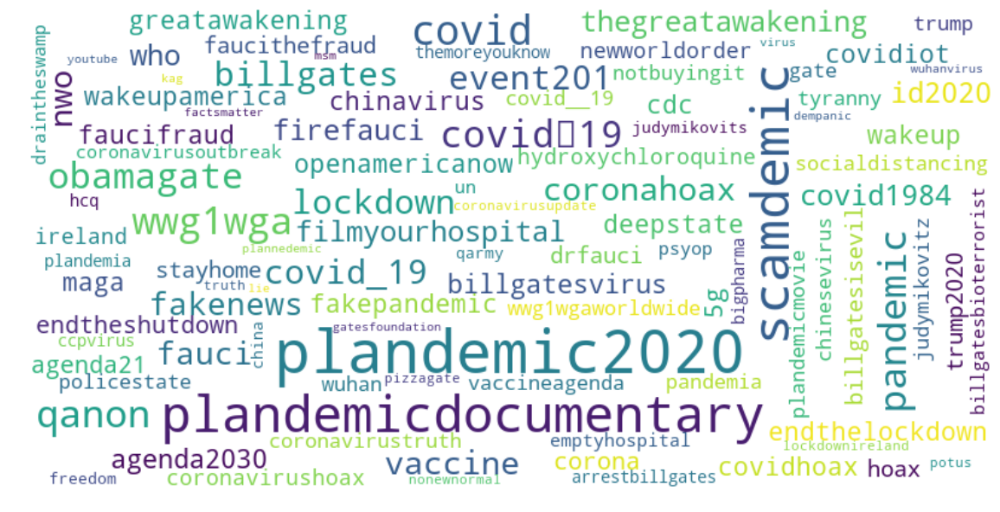

plandemic 5888


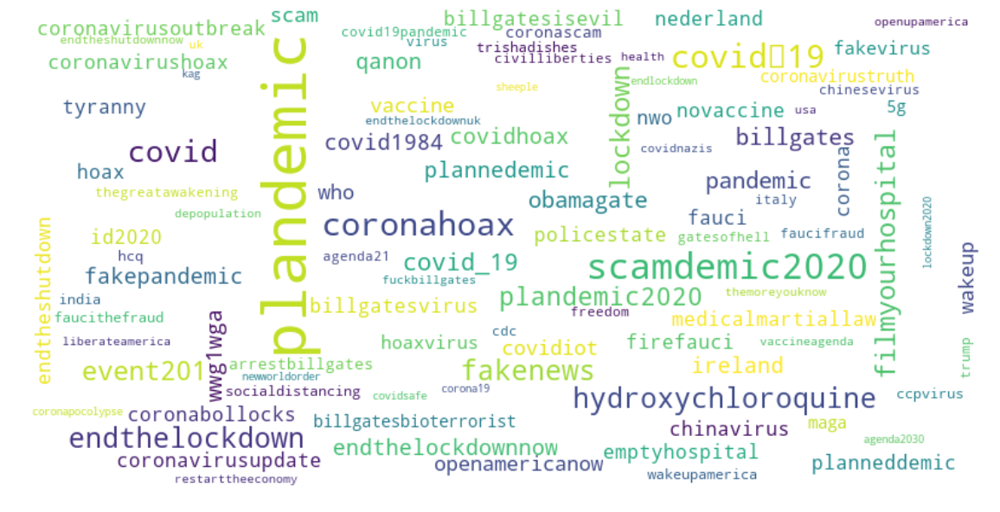

scamdemic 1237


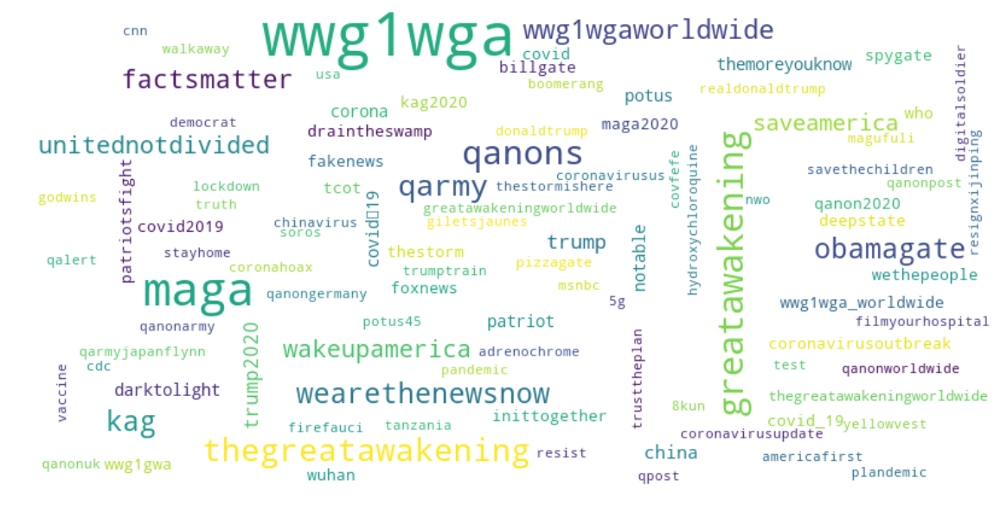

qanon 20517


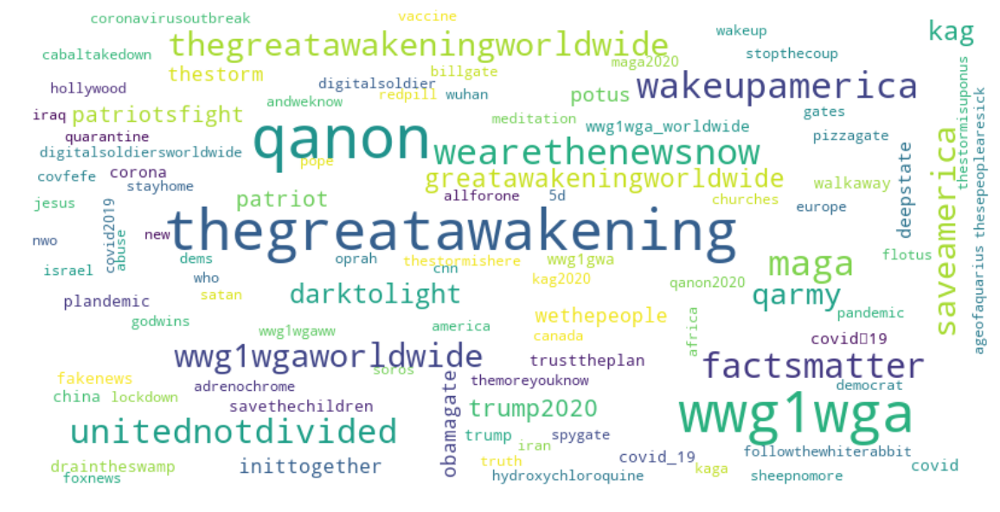

greatawakening 7000


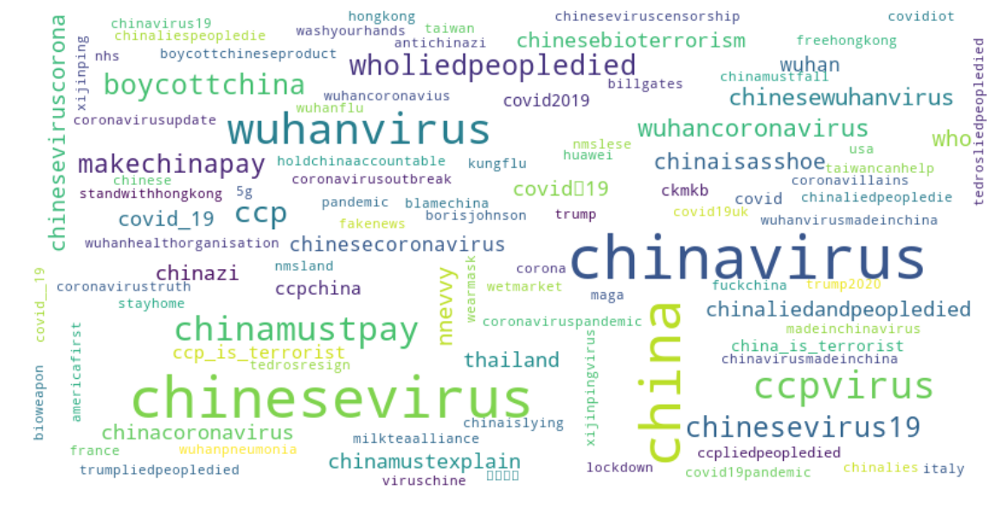

chinaliedpeopledied 13423


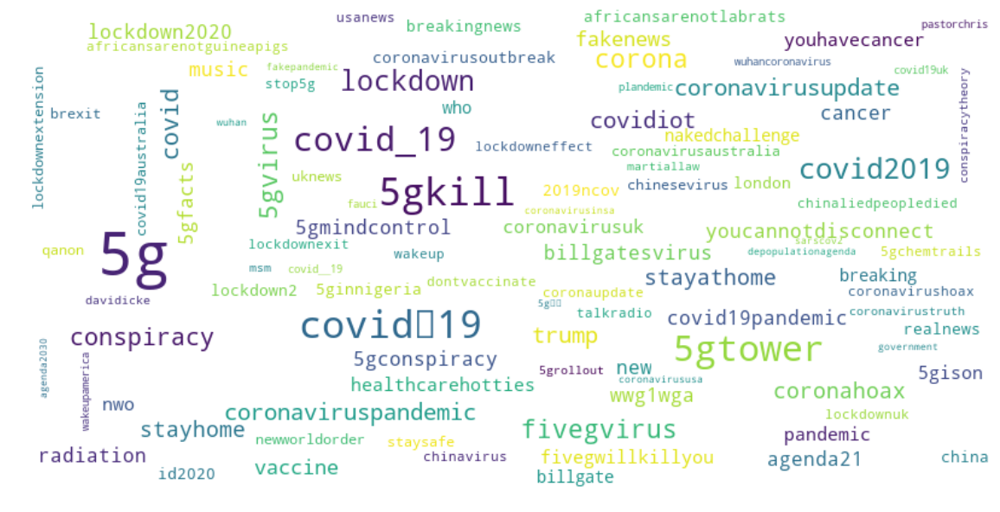

5gcoronavirus 707


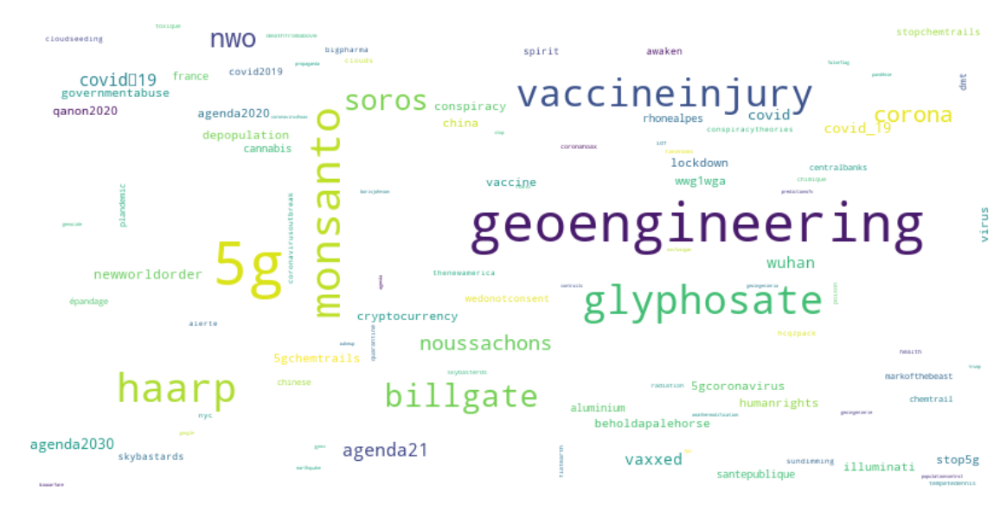

chemtrails 857


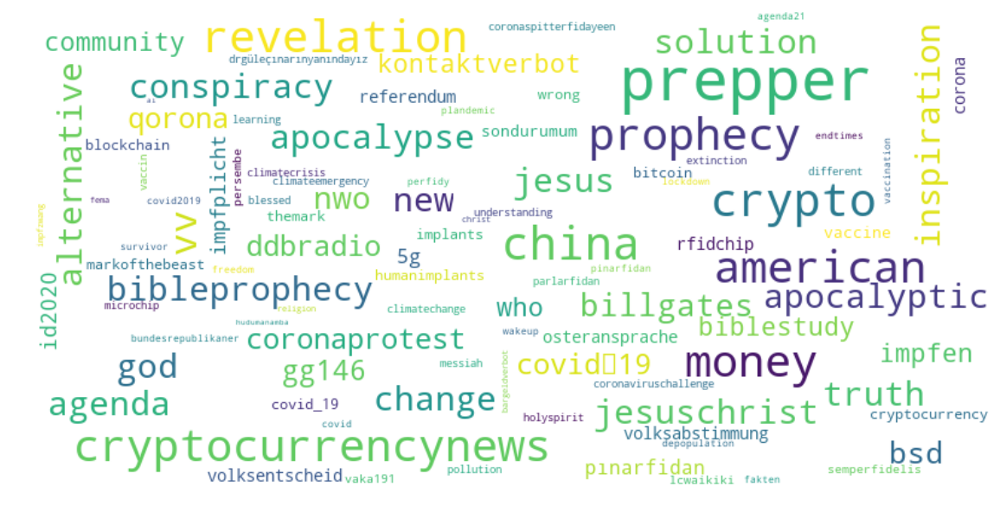

rfid 327


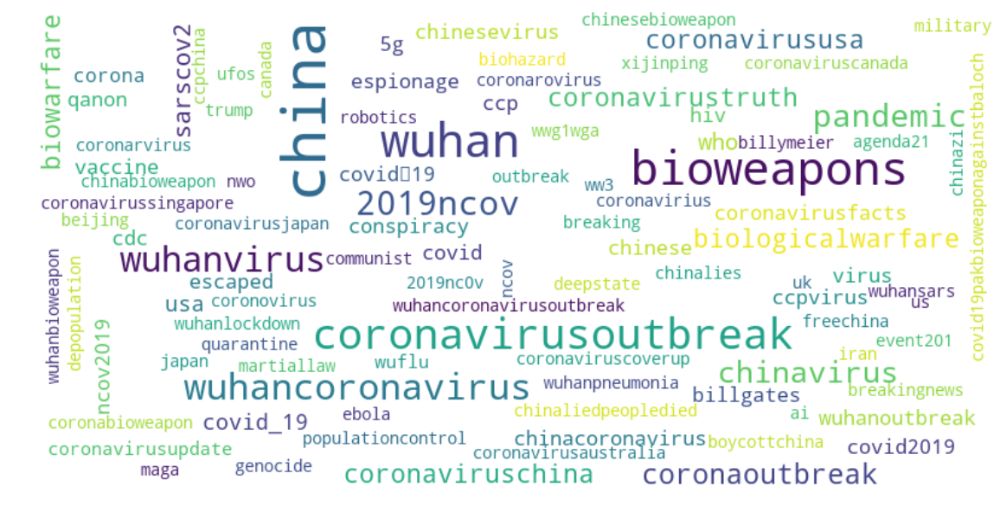

bioweapon 4246


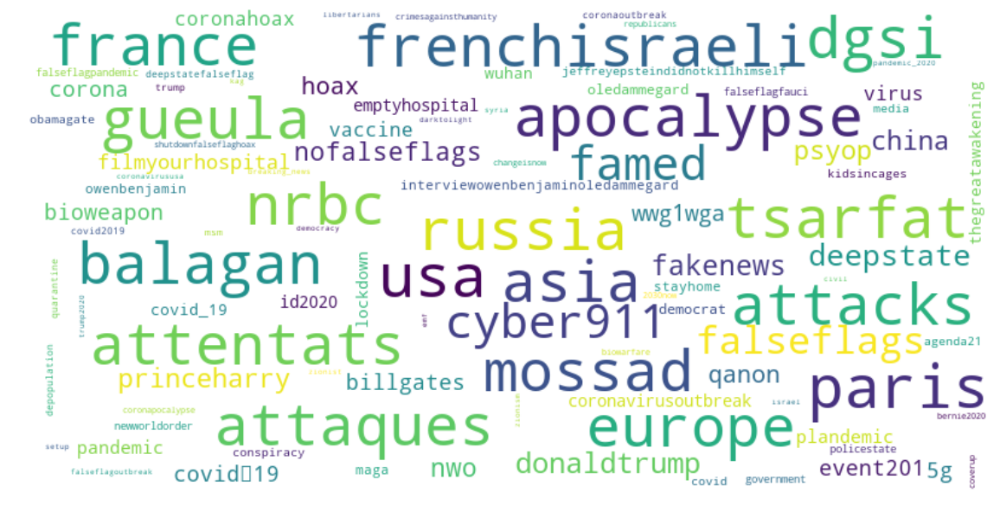

falseflag 654


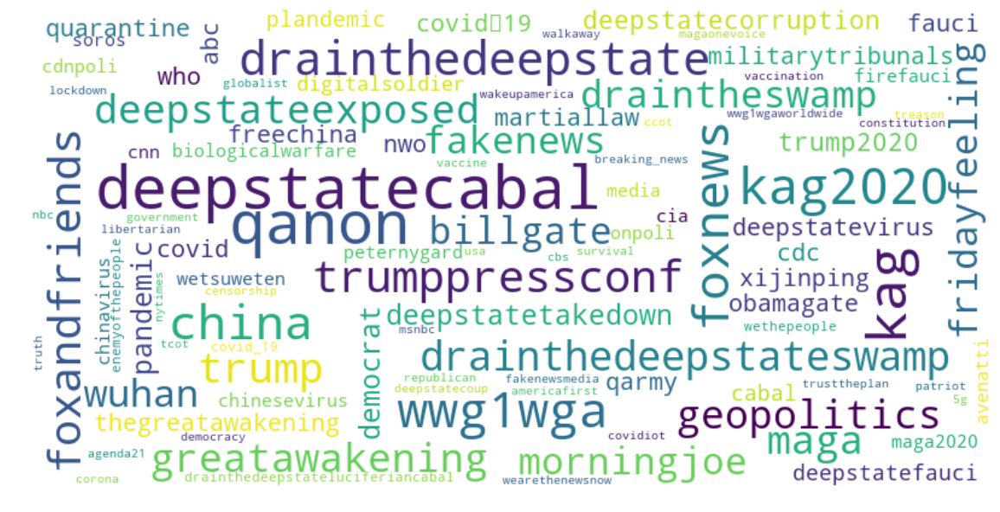

deepstate 6272


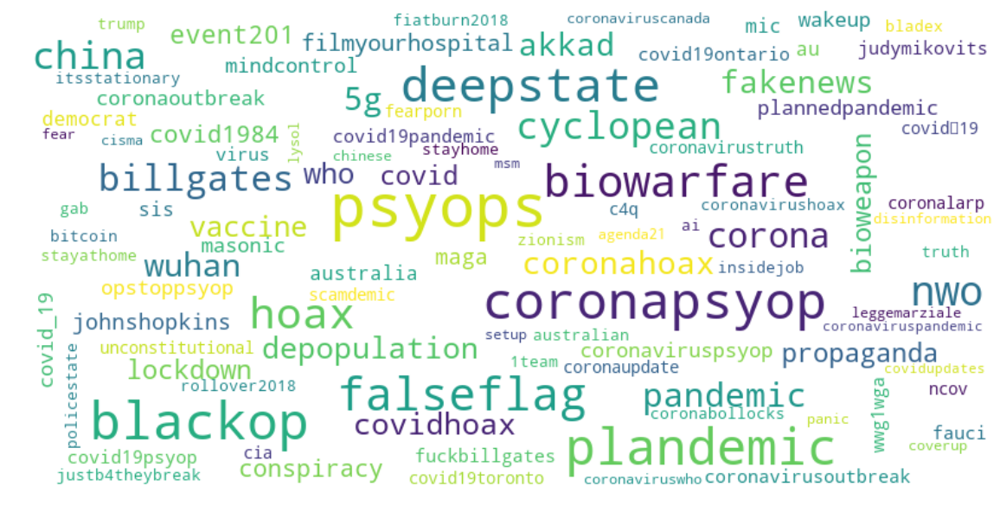

psyop 350


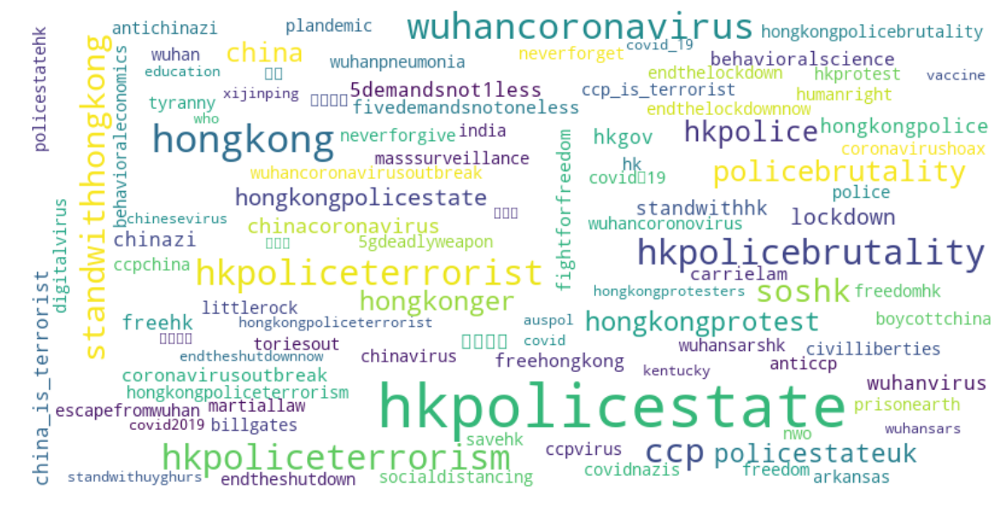

policestate 3094


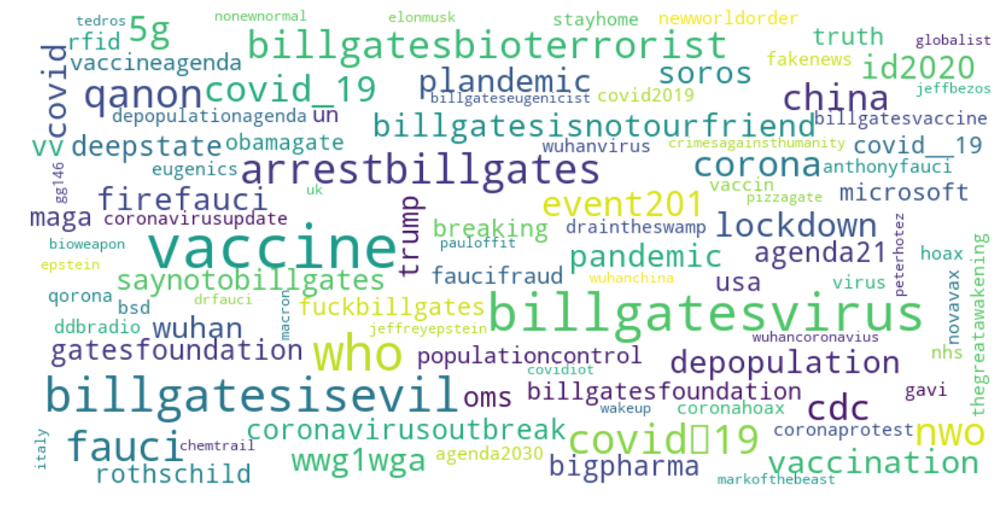

billgates 13134


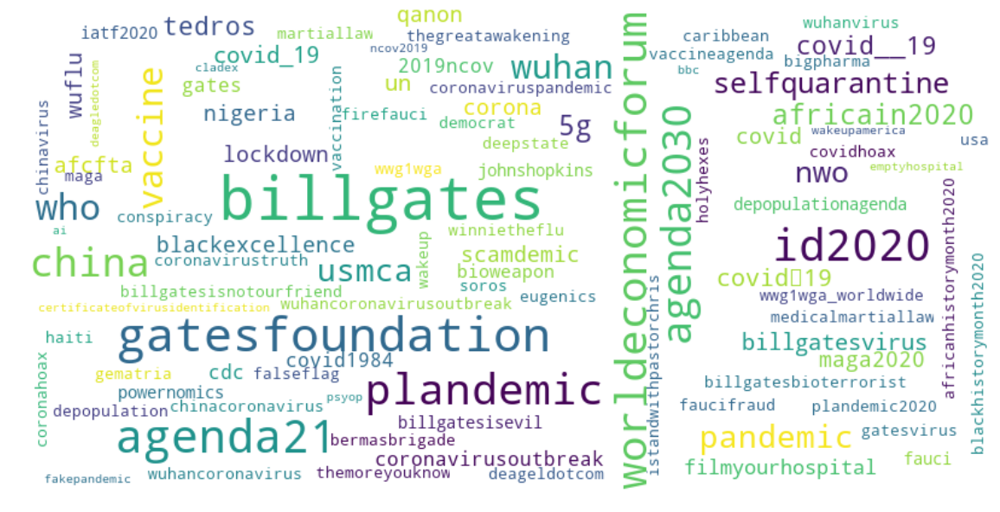

event201 2795


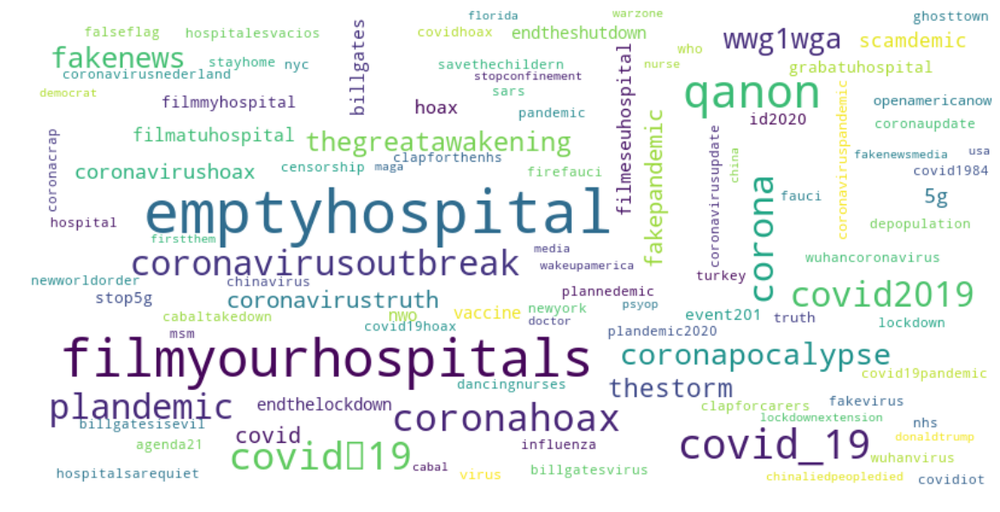

filmyourhospital 3006


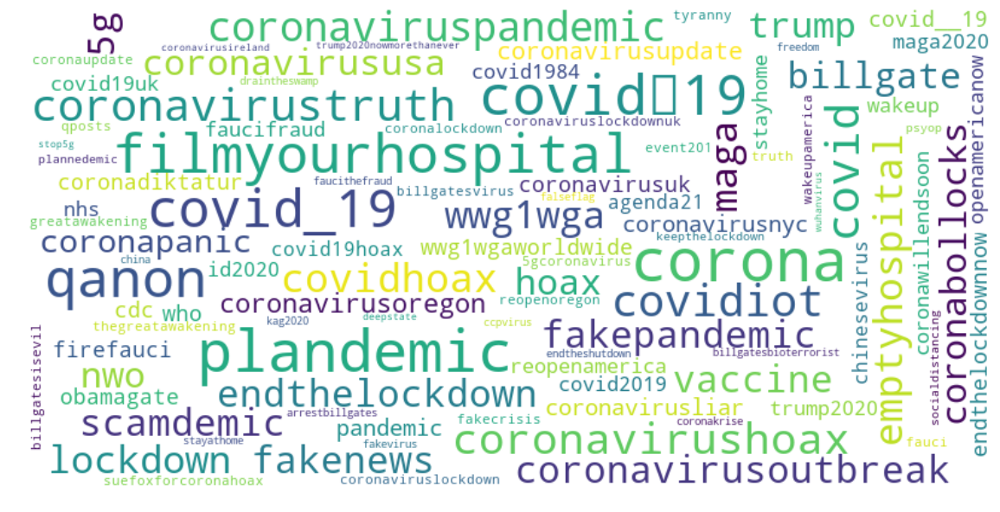

coronahoax 2007


In [33]:
# Get users associated with conspiracy theories and plot wordclouds for related hashtags

clouds=True
conspiracy_users_h, conspiracy_dict_h, consps_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),keywords,cloud=clouds)
# general_users_h, general_dict_h, general_consps_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),general_keywords,cloud=clouds)
# china_users_h, china_dict_h, china_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),china_keywords,cloud=clouds)
# bill_users_h, bill_dict_h, bill_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),bill_keywords,cloud=clouds)
# fiveg_users_h, fiveg_dict_h, fiveg_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),fiveg_keywords,cloud=clouds)
# hosp_users_h, hosp_dict_h, hosp_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),hosp_keywords,cloud=clouds)
# qanon_users_h, qanon_dict_h, qanon_df_h = get_hashtags_tweets(df.dropna(subset=['hashtag']),qanon_keywords,cloud=clouds)

In [35]:
all_consp_hashtags_df = pd.concat([consps_df_h,general_consps_df_h,china_df_h,bill_df_h,fiveg_df_h,hosp_df_h,qanon_df_h],axis=0)
all_consp_hashtags_df.drop_duplicates(inplace=True)

In [37]:
print('Unique conspiracy tweeters:            ',len(list(set(conspiracy_users_h))))
print('Unique general conspiracy tweeters:    ',len(list(set(general_users_h))))
print('Unique China conspiracy tweeters:      ',len(list(set(china_users_h))))
print('Unique Bill Gates conspiracy tweeters: ',len(list(set(bill_users_h))))
print('Unique 5g conspiracy tweeters:         ',len(list(set(fiveg_users_h))))
print('Unique hospital conspiracy tweeters:   ',len(list(set(hosp_users_h))))
print('Unique qanon conspiracy tweeters:      ',len(list(set(qanon_users_h))))

Unique conspiracy tweeters:             50486
Unique general conspiracy tweeters:     3066
Unique China conspiracy tweeters:       33307
Unique Bill Gates conspiracy tweeters:  1607
Unique 5g conspiracy tweeters:          825
Unique hospital conspiracy tweeters:    3059
Unique qanon conspiracy tweeters:       20693


## Conspiracy keywords in tweet text

Looking at the tweet text instead of hashtags

In [427]:
conspiracy_users, conspiracy_dict, consps_df = get_text_tweets(df,keywords)
general_users, general_dict, general_consps_df = get_text_tweets(df,general_keywords)
china_users, china_dict, china_df = get_text_tweets(df,china_keywords)
bill_users, bill_dict, bill_df = get_text_tweets(df,bill_keywords)
fiveg_users, fiveg_dict, fiveg_df = get_text_tweets(df,fiveg_keywords)
hosp_users, hosp_dict, hosp_df = get_text_tweets(df,hosp_keywords)
qanon_users, qanon_dict, qanon_df = get_text_tweets(df,qanon_keywords)

In [428]:
all_consp_text_df = pd.concat([consps_df,general_consps_df,china_df,bill_df,fiveg_df,hosp_df,qanon_df],axis=0)
all_consp_text_df.drop_duplicates(inplace=True)

In [133]:
print('Unique conspiracy tweeters:            ', len(list(set(conspiracy_users))))
print('Unique general conspiracy tweeters:    ', len(list(set(general_users))))
print('Unique China conspiracy tweeters:      ', len(list(set(china_users))))
print('Unique Bill Gates conspiracy tweeters: ', len(list(set(bill_users))))
print('Unique 5g conspiracy tweeters:         ', len(list(set(fiveg_users))))
print('Unique hospital conspiracy tweeters:   ', len(list(set(hosp_users))))
print('Unique qanon conspiracy tweeters:      ', len(list(set(qanon_users))))

Unique conspiracy tweeters:             50486
Unique general conspiracy tweeters:     3033
Unique China conspiracy tweeters:       33307
Unique Bill Gates conspiracy tweeters:  1470
Unique 5g conspiracy tweeters:          775
Unique hospital conspiracy tweeters:    3059
Unique qanon conspiracy tweeters:       20693


## News urls and conspiracies

In [250]:
# Urls and number of users
url_keys = url_dict.keys()
url_tots = [len(i) for i in url_dict.values()]

In [251]:
# All tweeters who tweet using conspiracy theory hashtags
all_consp_users = list(set(list(conspiracy_users)+list(china_users)+\
                           list(fiveg_users)+list(bill_users)+list(hosp_users)+\
                           list(qanon_users)))
len(all_consp_users)

90665

In [225]:
# General (non conspiracy) tweeters who use urls from each sources
url_general_users = {}
for key,value in url_dict.items():
    url_general_users[key] = list(set(url_dict[key]).difference(set(all_consp_users)))

In [253]:
# Number of general (non conspiracy) tweeters who use urls from each sources
num_url_general = {}
for key,value in url_dict.items():
    num_url_general[key] = len((set(url_dict[key]).difference(set(all_consp_users))))

In [252]:
# Number of tweeters who use urls from each sources who tweet conspiracy theories
num_url_consp = {}
for key,value in url_dict.items():
    num_url_consp[key] = len((set(url_dict[key]).intersection(set(all_consp_users))))

In [228]:
# Tweeters who use specific news urls
url_consp_users = {}
for key,value in url_dict.items():
    url_consp_users[key] = set(url_dict[key]).intersection(set(all_consp_users))

In [229]:
url_consp_values = list(num_url_consp.values())
url_props = [vals/tots for vals,tots in zip(url_consp_values,url_tots)]

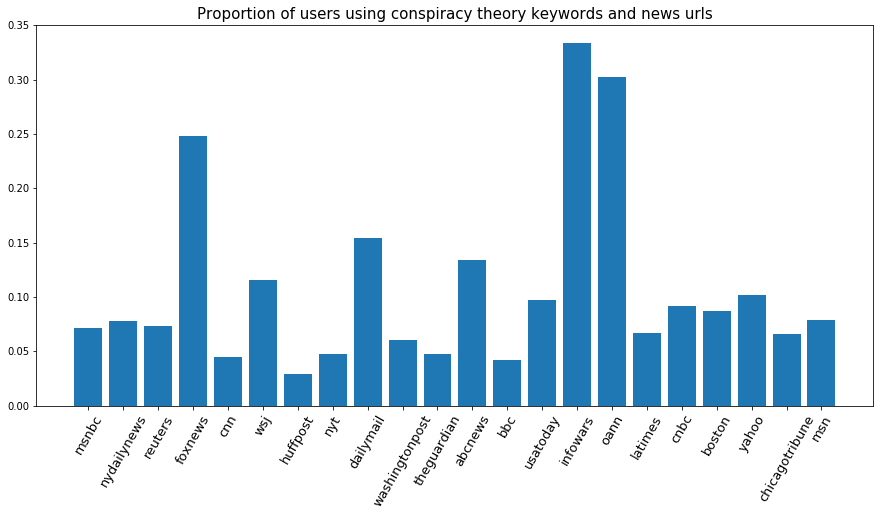

In [230]:
plt.figure(figsize=(15,7))
plt.title('Proportion of users using conspiracy theory keywords and news urls',size=15)
plt.bar(url_keys,url_props)
plt.xticks(rotation=60,fontsize=13)
plt.show()

In [241]:
# Heatmap matrix for each news website as proportion on users who  
user_consp_dict = {'general conspiracies':conspiracy_users,'china lies':china_users,'billgates':bill_users,'qanon':qanon_users,'5g':fiveg_users,
                   'hospital':hosp_users}
# user_consp_dict = {'general conspiracies':conspiracy_users,'china lies':china_users,'billgates':bill_users,'qanon':qanon_users,'5g':fiveg_users,
#                    'hospital':hosp_users,'non conspiracy users':url_botscores}

heatmap_matrix = np.zeros((len(url_dict),len(user_consp_dict)))

for i,(urlkey,urlval) in enumerate(url_dict.items()):
    for j,(userkey,userval) in enumerate(user_consp_dict.items()):
        heatmap_matrix[i,j] = len((set(urlval).intersection(set(userval))))/(len(userval)*len(urlval))*100*100

In [242]:
num_user_keys = [consp + ': ' + str(len(user_consp_dict[consp])) for consp in user_consp_dict.keys()]

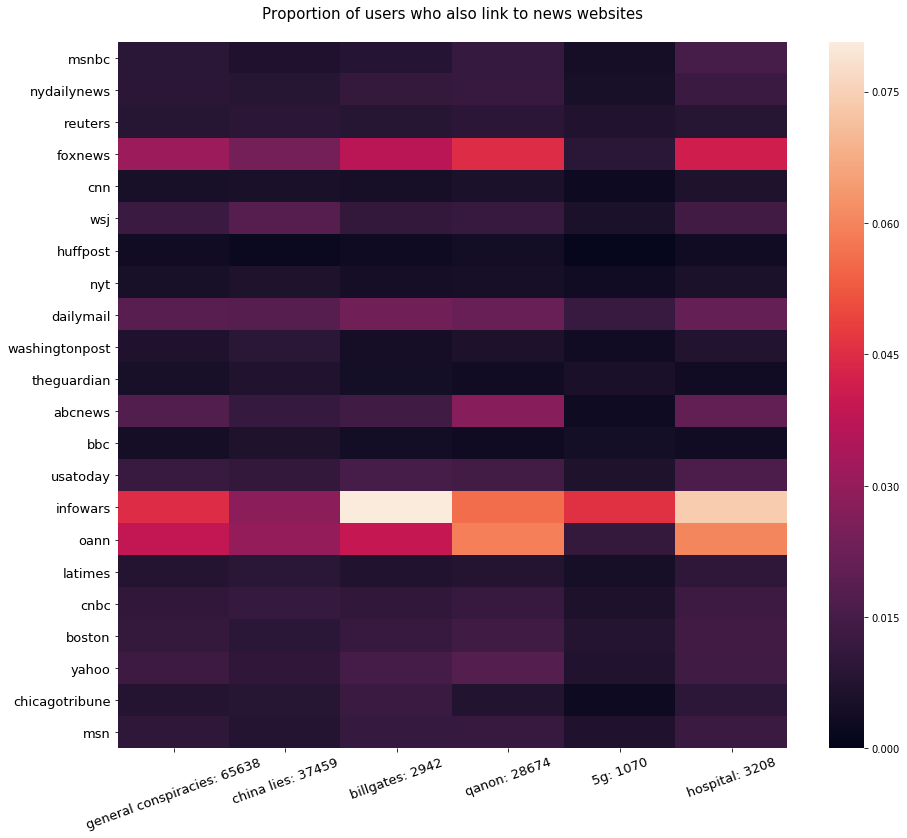

In [243]:
plt.figure(figsize=(15,13))
sns.heatmap(heatmap_matrix, xticklabels=num_user_keys, yticklabels=news_sources,vmin=0)
plt.title('Proportion of users who also link to news websites\n',fontsize=15)
plt.yticks(fontsize=13)
plt.xticks(rotation=20,fontsize=13)
plt.show()

### Drill down on bots

In [235]:
# Include non conspiracy theory users
user_consp_dict = {'general conspiracies':conspiracy_users,'china lies':china_users,'billgates':bill_users,'qanon':qanon_users,'5g':fiveg_users,
                   'hospital':hosp_users,'non conspiracy users':url_botscores}
num_user_keys = [consp+ ': ' + str(len(user_consp_dict[consp])) for consp in user_consp_dict.keys()]

In [236]:
heatmap_matrix_bots = np.zeros((len(url_dict),len(user_consp_dict)))

for i,(urlkey,urlval) in enumerate(url_dict.items()):
    for j,(userkey,userval) in enumerate(user_consp_dict.items()):
        
        users = list(set(urlval).intersection(set(userval)))
        score_list = []
        for user in users:
            if all_botdict_en.get(user):
                score_list.append(all_botdict_en.get(user))
        if len(score_list) > 0:
            heatmap_matrix_bots[i,j] = sum(score_list)/len(score_list)
        else:
            heatmap_matrix_bots[i,j] = np.mean(list(all_botdict_en.values()))
        

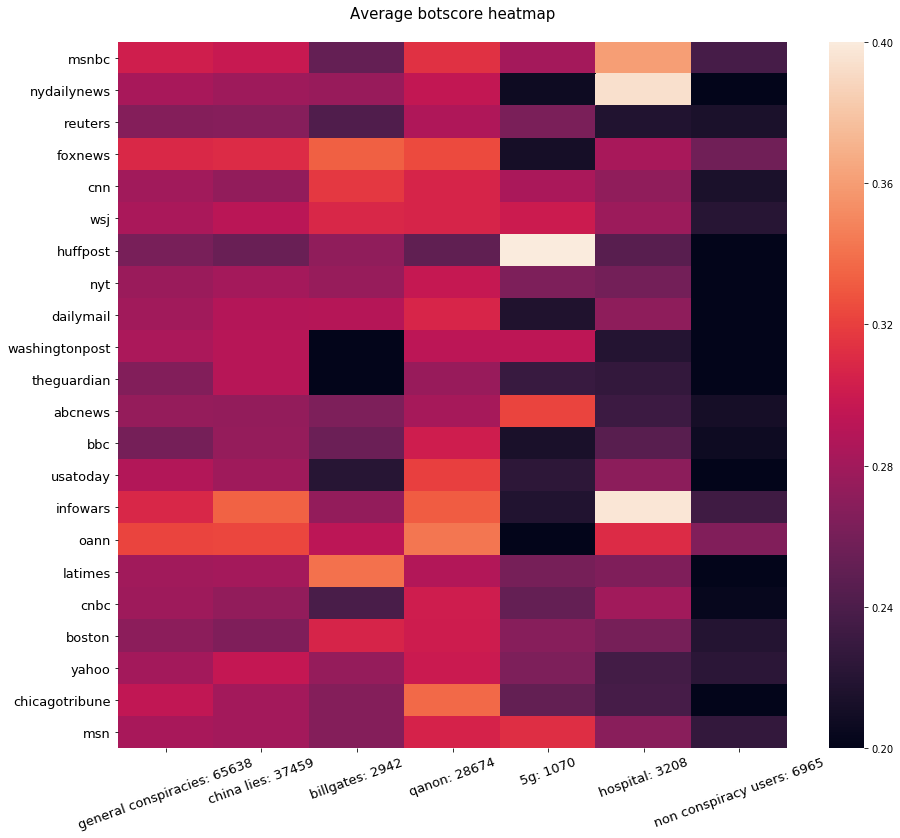

In [237]:
plt.figure(figsize=(15,13))
plt.title('Average botscore heatmap\n',fontsize=15)
sns.heatmap(heatmap_matrix_bots, xticklabels=num_user_keys, yticklabels=news_sources,vmax=0.4,vmin=0.2)
plt.yticks(fontsize=13)
plt.xticks(rotation=20,fontsize=13)
plt.show()

# Bot analysis

## Get user handles for botometer

Getting screen names to query using Botometer

In [255]:
account_totals = df[['userid','screen_name']].groupby(['userid','screen_name']).size()
account_totals.sort_values(ascending=False)

userid                           screen_name    
2669983818                       test5f1798         2733
99539910                         chorleychicken     1694
2669983818                       test5f1798         1595
99539910                         chorleychicken     1324
3006834917                       skowtura_ini       1144
                                                    ... 
1027025235491610624              allison_ahu           1
1027022431020441601              julianamanigo         1
745310579460554752               annprin45541241       1
1027019569167183872              rasharahma1           1
retweeted_tweet_without_comment  266                   1
Length: 1265819, dtype: int64

In [131]:
account_totals = account_totals.sort_values(ascending=False)
# account_totals.to_csv('conspiracy_ids_05_23.csv')

/Users/jaimin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  


In [118]:
url_props = [vals/tots for vals,tots in zip(url_consp_values,url_tots)]

In [266]:
# pd.DataFrame(all_consp_users).to_csv('conspiracy_ids_1.csv')

## Load botscore queries

In [49]:
# Get botometer scores from conspiracy users
def botometer_query(filename,name_list):

    rapidapi_key = "6ac8fe69aamshcc30411e7824b49p12a1cajsnc2267278951c" # now it's called rapidapi key
    twitter_app_auth = {
        'consumer_key': 'DPIuUoHQsmaeK7UCyQZPxk1pD',
        'consumer_secret': 'SLDDw1VCdbF1ZpWl8xnNRekgw2Occd7ltVPuxo4tfyTZRPd8aq',
        'access_token': '1239432784319406080-vcW86zKro0M7e5pszZvRvAyXIVFy96',
        'access_token_secret': 'VlphE7Es3sjviibpmCmpTT1GdbZ180awYtE6FpKHR6qhl',
      }

    botometer_api_url = 'https://botometer-pro.p.rapidapi.com'
    bom = botometer.Botometer(botometer_api_url=botometer_api_url,
                              wait_on_ratelimit=True,
                              rapidapi_key=rapidapi_key,
                              **twitter_app_auth)

    # Check a single account by screen name
    result = bom.check_account('@clayadavis')

    # Check a single account by id
    result = bom.check_account(1548959833)

    # Check a sequence of accounts
    for screen_name, result in bom.check_accounts_in(name_list):

        this_acc = screen_name
        with open(filename, 'a+') as file:
            file.write('%s\n' % json.dumps(result))


In [43]:
# Returns a list of jsons of each uesr
def read_bot_csv(csv_name):
    file = open(csv_name)
    return file.readlines()

In [44]:
# Get dictionary of botscores from list of botometer json
def users_dict(json_list):
    bot_dict = {}
    for user in json_list:
        this_user = json.loads(user)
        if this_user.get('user'):
            bot_dict[this_user.get('user').get('screen_name')] = this_user.get('scores').get('english')
    
    return bot_dict

In [126]:
botscore_files = ['botometer_results/consp_users_bot_scores.csv',
                  'botometer_results/consp_reetweets_bot_scores.csv',
                  'botometer_results/consp_bot_scores_v1.csv',
                  'botometer_results/consp_bot_scores_v2.csv',
                  'botometer_results/consp_bot_scores_v3.csv',
                  'botometer_results/botometer_conspiracy_05_21.csv',
                  'botometer_results/botometer_conspiracy_users_05_22.csv',
                  'botometer_results/botometer_conspiracy_05_27.csv',
                  'botometer_results/botometer_conspiracy_05_27_2.csv',
                  'botometer_results/botometer_general_06_03_unfinished.csv',
                  'botometer_results/botometer_general_url - Copy.csv',
                  'botometer_results/botometer_general_url_2 - Copy.csv',
                  'botometer_results/url_general_bot_queries.csv'
                ]

all_botscores = []
all_botdict_en = {}
for botfile in botscore_files:
    these_botscores = read_bot_csv(botfile)
    all_botdict_en.update(users_dict(these_botscores))
    all_botscores += these_botscores

In [23]:
# all_botdict_en

In [135]:
print('Number of botscores:',len(all_botscores))
print('Number of botscores:',len(all_botdict_en))

Number of botscores: 139736
Number of botscores: 104361


In [256]:
# For url users for baseline comparison
url_bot_files = ['botometer_results/botometer_general_06_03_unfinished.csv',
                  'botometer_results/botometer_general_url - Copy.csv',
                  'botometer_results/botometer_general_url_2 - Copy.csv',
                  'botometer_results/url_general_bot_queries.csv',
                ]
url_botscores = {}

for file in url_bot_files:
    these_scores = read_bot_csv(file)
    url_botscores.update(users_dict(these_botscores))

In [24]:
# # Find Conspiracy theory users
# rt_scored_users = list(rt_df[rt_df['screen_name'].isin(set(all_botdict_en.keys()))].screen_name.unique())
# orig_scored_users = list(orig_df[orig_df['screen_name'].isin(set(all_botdict_en.keys()))].screen_name.unique())

In [66]:
# Get lists of scores
rt_scores = []
orig_scores = []
for name in rt_scored_users:
    rt_scores.append(all_botdict_en[name])
for name in orig_scored_users:
    orig_scores.append(all_botdict_en[name])

## Botscore Results

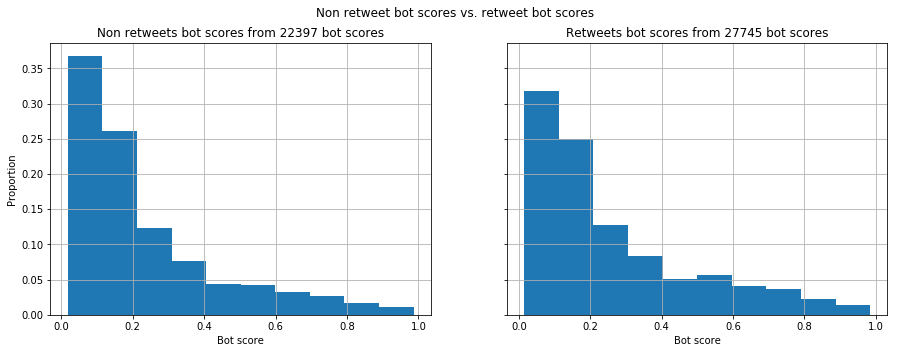

In [67]:
# Bot scores
fig, ax = plt.subplots(1,2,figsize=(15,5),sharey=True)
fig.suptitle('Non retweet bot scores vs. retweet bot scores')
ax[0].set_ylabel('Proportion')
ax[0].set_xlabel('Bot score')

ax[0].hist(orig_scores, weights=np.ones(len(orig_scores))/len(orig_scores))
ax[0].set_title('Non retweets bot scores from %d bot scores' % len(orig_scores))
ax[0].grid()

ax[1].set_xlabel('Bot score')
ax[1].hist(rt_scores, weights=np.ones(len(rt_scores))/len(rt_scores))
ax[1].set_title('Retweets bot scores from %d bot scores' % len(rt_scores))
ax[1].grid()
plt.show()

In [68]:
bots_general_05_21 = read_bot_csv('botometer_results/botometer_conspiracy_05_21.csv')
user_bots_05_21 = users_dict(bots_general_05_21)
# bots_general_06_03 = read_bot_csv('botometer_results/botometer_general_06_03_unfinished.csv')
# user_bots_06_03 = users_dict(bots_general_06_03)
bots_consp_05_22 = read_bot_csv('botometer_results/botometer_conspiracy_users_05_22.csv')
user_bots_05_22 = users_dict(bots_consp_05_22)
botvals_general = list(user_bots_05_21.values())
# botvals_general = list(user_bots_06_03.values())
botvals_consp = list(user_bots_05_22.values())
# print(len(user_bots_06_03))
print(len(user_bots_05_21))
print(len(user_bots_05_22))

16677
4573


In [69]:
# Get general botscores vs conspiracy botscores
all_botdict_en_general = {screen_name: all_botdict_en[screen_name] for screen_name in user_bots_05_21.keys()}
# all_botdict_en_general = {screen_name: all_botdict_en[screen_name] for screen_name in user_bots_06_03.keys()}
all_botdict_en_consp = {}
general_user_set = set([i.lower() for i in user_bots_05_21.keys()])
# general_user_set = set([i.lower() for i in user_bots_06_03.keys()])

for screen_name,score in all_botdict_en.items():
    if screen_name not in general_user_set:
        all_botdict_en_consp[screen_name] = all_botdict_en[screen_name]

botvals_general = list(all_botdict_en_general.values())
botvals_consp = list(all_botdict_en_consp.values())
        
print(len(all_botdict_en_general))
print(len(all_botdict_en_consp))

16677
87210


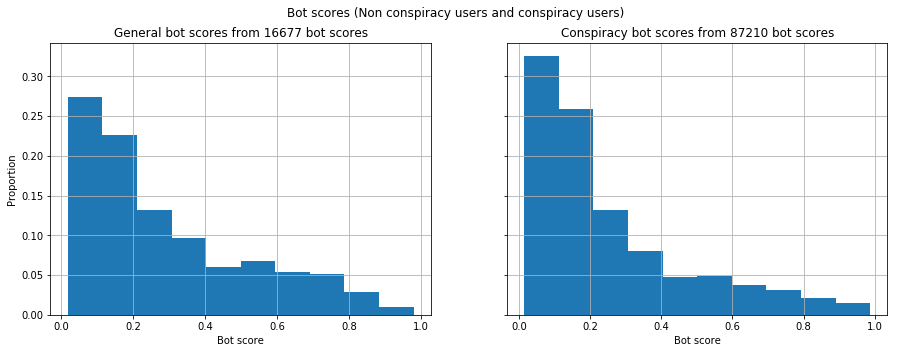

In [70]:
fig, ax = plt.subplots(1,2,figsize=(15,5),sharey=True)
fig.suptitle('Bot scores (Non conspiracy users and conspiracy users)')

ax[0].set_ylabel('Proportion')
ax[0].set_xlabel('Bot score')

ax[0].hist(botvals_general, weights=np.ones(len(botvals_general)) / len(botvals_general))
ax[0].set_title('General bot scores from %d bot scores' % len(botvals_general))
ax[0].grid()

ax[1].set_xlabel('Bot score')
ax[1].hist(botvals_consp, weights=np.ones(len(botvals_consp)) / len(botvals_consp))
ax[1].set_title('Conspiracy bot scores from %d bot scores' % len(botvals_consp))
ax[1].grid()
plt.show()

In [71]:
# Get botscores for each conspiracy theory
all_botdict_en_china = {}
all_botdict_en_bill = {}
all_botdict_en_qanon = {}
all_botdict_en_hosp = {}
all_botdict_en_fiveg = {}

all_botuser_set = set(all_botdict_en.keys())
for screen_name in all_botdict_en.keys():
    if screen_name in china_users:
        all_botdict_en_china[screen_name] = all_botdict_en[screen_name]
    if screen_name in bill_users:
        all_botdict_en_bill[screen_name] = all_botdict_en[screen_name]
    if screen_name in qanon_users:
        all_botdict_en_qanon[screen_name] = all_botdict_en[screen_name]
    if screen_name in hosp_users:
        all_botdict_en_hosp[screen_name] = all_botdict_en[screen_name]
    if screen_name in fiveg_users:
        all_botdict_en_fiveg[screen_name] = all_botdict_en[screen_name]
    
print(len(all_botdict_en_china))
print(len(all_botdict_en_bill))
print(len(all_botdict_en_qanon))
print(len(all_botdict_en_hosp))
print(len(all_botdict_en_fiveg))

13565
750
7709
1127
273


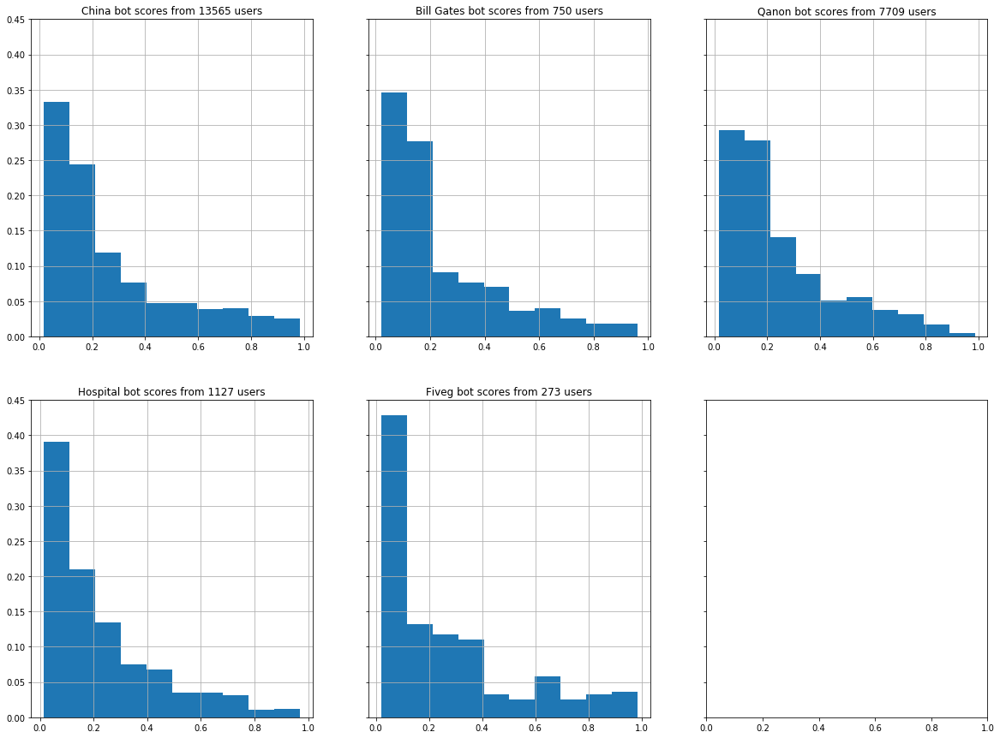

In [72]:
fig, ax = plt.subplots(2,3,figsize=(20,15) ,sharey=True)
# fig.suptitle('Bot scores (Non conspiracy users and conspiracy users)')

# ax[0,0].set_ylabel('Proportion')
# ax[0].set_xlabel('Bot score')

ax[0,0].hist(all_botdict_en_china.values(), weights=np.ones(len(all_botdict_en_china)) / len(all_botdict_en_china))
ax[0,0].set_title('China bot scores from %d users' % len(all_botdict_en_china))
ax[0,0].grid()

ax[0,1].hist(all_botdict_en_bill.values(), weights=np.ones(len(all_botdict_en_bill)) / len(all_botdict_en_bill))
ax[0,1].set_title('Bill Gates bot scores from %d users' % len(all_botdict_en_bill))
ax[0,1].grid()

ax[0,2].hist(all_botdict_en_qanon.values(), weights=np.ones(len(all_botdict_en_qanon)) / len(all_botdict_en_qanon))
ax[0,2].set_title('Qanon bot scores from %d users' % len(all_botdict_en_qanon))
ax[0,2].grid()

ax[1,0].hist(all_botdict_en_hosp.values(), weights=np.ones(len(all_botdict_en_hosp)) / len(all_botdict_en_hosp))
ax[1,0].set_title('Hospital bot scores from %d users' % len(all_botdict_en_hosp))
ax[1,0].grid()

ax[1,1].hist(all_botdict_en_fiveg.values(), weights=np.ones(len(all_botdict_en_fiveg)) / len(all_botdict_en_fiveg))
ax[1,1].set_title('Fiveg bot scores from %d users' % len(all_botdict_en_fiveg))
ax[1,1].grid()

plt.show()

# Find significant users

Finding prominent misinformation spreaders 

In [73]:
# Split into high and low botscores

In [74]:
# Split into high and low botscores
# Create dataframe for each user
# Columns = ['Number of tweets','Follower count','% Retweets','Account creation date','Botscore',All URLS, ALL CONSPIRACIES]

In [37]:
# conspiracies = [consp for consp in user_consp_dict.keys()]

In [202]:
user_columns = ['Screen Name','Botscore','Covid Tweets','Follower Count','Favourites Count','Retweets Count',
                'Non Retweets Count','Account Created','Location','Retweeted Count', 'Mentioned Count','Language',
                'User ID'] + [consp for consp in user_consp_dict.keys()]

user_df = pd.DataFrame(columns = user_columns)

In [203]:
from ast import literal_eval

In [244]:
# keywords_df.isna().sum()

In [35]:
# Create the dataframe adding information for each tweet
user_df = pd.DataFrame(columns = user_columns)
already_added = dict()
already_added_id = dict()
retweet_dict = dict()
mention_dict = dict()

counter = 0
for index, row in tqdm(df.iloc[:,:].dropna(subset='followers_count').iterrows()):
    break
    
    if int(row['followers_count']) < 1000:
        continue
    else:

        # If its a new entry
        if row['screen_name'] not in already_added:
            added = False

            already_added[row['screen_name']] = counter
            already_added_id[row['userid']] = counter

            user_row = pd.Series(index=user_columns).fillna(0)
            user_row['Screen Name','Follower Count','Favourites Count','User ID','Account Created','Location'
                     ,'Language'] = row[['screen_name','followers_count','favourites_count','user_id',
                     'account_creation_date','location','lang']].values        

            # Botscores
            user_row['Botscore'] = all_botdict_en.get(row['screen_name'])
            counter += 1

        # If there is already an entry for this user
        else:
            added = True
            idx = already_added[row['screen_name']]
            user_row = user_df.iloc[idx,:]

        user_row['Covid Tweets'] = user_row['Covid Tweets'] + 1

        if np.isnan(row['rt_userid']):
            user_row['Non Retweets Count'] = user_row['Non Retweets Count'] + 1
        else:
            user_row['Retweets Count'] = user_row['Retweets Count'] + 1
            if retweet_dict.get(row['rt_userid']):
                retweet_dict[row['rt_userid']] = retweet_dict[row['rt_userid']] + 1
            else:
                retweet_dict[row['rt_userid']] = 1

        # Add to mention and retweet count
        if type(row['mentionsn']) == str:
            if len(row['mentionsn']) > 2:
                mentions = literal_eval(row['mentionsn'])
                for mentionsn in mentions:
                    if mention_dict.get(mentionsn):
                        mention_dict[mentionsn] = mention_dict[mentionsn] + 1
                    else:
                        mention_dict[mentionsn] = 1

        # Add to user index
        if row['screen_name'] in general_users:
            user_row['general conspiracies'] = user_row['general conspiracies'] + 1

        if row['screen_name'] in china_users:
            user_row['china lies'] = user_row['china lies'] + 1

        if row['screen_name'] in bill_users:
            user_row['billgates'] = user_row['billgates'] + 1

        if row['screen_name'] in fiveg_users:
            user_row['5g'] = user_row['5g'] + 1

        if row['screen_name'] in hosp_users:
            user_row['hospital'] = user_row['hospital'] + 1

        if row['screen_name'] in qanon_users:
            user_row['qanon'] = user_row['qanon'] + 1

#         for url, url_vals in url_consp_users.items():
#             if row['screen_name'] in url_vals:
#                 user_row[url] = user_row[url] + 1

        if not added:
            user_df = user_df.append(user_row,ignore_index=True)
        else:
            user_df.update(pd.DataFrame(user_row).T)

# user_df

NameError: name 'user_columns' is not defined

In [25]:
# {k: v for k, v in sorted(mention_dict.items(), key=lambda item: item[1], reverse=True)}

In [338]:
for i,row in tqdm(user_df.iloc[:,:].iterrows()):
    if row['followers_count'] < 1000:
        pass
    else:

In [345]:
# user_df.to_csv('tweeter_info.csv')
user_df.sort_values('Covid Tweets',ascending=False)
# user_df.sort_values('Botscore')

,Screen Name,Botscore,Covid Tweets,Follower Count,Favourites Count,Retweets Count,Non Retweets Count,Account Created,Location,Retweeted Count,...,boston,yahoo,chicagotribune,msn,general conspiracies,china lies,billgates,qanon,5g,hospital
1068,r__worldnews,0.70642,303,214,0,0,303,fri dec 29 19:18:05 +0000 2017,NaN,0,...,0,0,0,0,0,0,0,0,0,0
455,viriyabot,0.813872,211,861,56,211,0,thu jul 14 12:47:03 +0000 2016,internet,0,...,211,211,0,211,0,211,0,0,0,0
894,skowtura_ini,None,204,608,118,0,204,sat jan 31 01:55:19 +0000 2015,uk,0,...,204,204,204,204,0,0,0,0,0,0
279,dubvnow,None,144,11030,51785,0,144,mon mar 19 01:02:16 +0000 2012,"morgantown, wv",0,...,0,0,0,0,0,0,0,0,0,0
17143,baronianconsult,None,128,1601,80902,53,75,wed jun 05 21:52:49 +0000 2013,NaN,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30555,mariaeugeniarc,None,1,585,13885,0,1,thu mar 25 21:03:13 +0000 2010,mexico,0,...,0,0,0,0,0,0,0,0,0,0
30556,tbygracezhu,None,1,1021,169,0,1,mon jun 22 11:59:25 +0000 2009,beijing,0,...,0,0,0,0,0,0,0,0,0,0
30557,drjoaquinid,None,1,92,39,1,0,mon jul 22 14:52:36 +0000 2019,NaN,0,...,0,0,0,0,0,0,0,0,0,0
30558,lamichhanen,None,1,538,3286,0,1,sat sep 07 11:27:20 +0000 2013,"bharatpur, nepal",0,...,0,0,0,0,0,0,0,0,0,0


In [324]:
# with open('retweet_dict.json','w') as file:
#     json.dump(retweet_dict,file)

# # with open('url_users.json', 'w') as outfile:
# #     json.dump(str(url_general_users), outfile)

In [323]:
# with open('mention_dict.json','w') as file:
#     json.dump(mention_dict,file)

In [61]:
# user_df = pd.read_csv('tweeter_info.csv',index_col=0)
# user_df.sort_values('Retweeted Count')

In [27]:
# with open('jsons/mention_dict.json') as json_file:
#     mention_dict_old = json.load(json_file)

In [28]:
# for index, row in tqdm(df.iloc[:,:].iterrows()):
#     pass

In [29]:
# {k: v for k, v in sorted(mention_dict.items(), key=lambda item: item[1], reverse=True)}

In [30]:
# user_df_prev

In [63]:
# scored_users = user_df.dropna(subset=['Botscore'])

In [32]:
# scored_users.shape

In [74]:
# high_bot = scored_users[scored_users.Botscore > 0.8]

In [80]:
# low_bot = scored_users[scored_users.Botscore < 0.05]

In [220]:
# most_tweets = scored_users[scored_users['Covid Tweets'] > 50]
# most_tweets

In [31]:
# scored_users.sort_values('Covid Tweets',ascending = False).head(20)

## Original Tweets

In [201]:
# Only include original tweets
all_keywords_df = orig_df[orig_df.tweet_type == 'original']
all_keywords_df.dropna(subset=['hashtag'],inplace=True)
all_keywords_df[['followers_count','favourites_count']] = all_keywords_df[['followers_count','favourites_count']].astype('float')

/Users/jaimin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [202]:
bill_df = all_keywords_df[all_keywords_df['screen_name'].isin(bill_users)]
fiveg_df = all_keywords_df[all_keywords_df['screen_name'].isin(fiveg_users)]
china_df = all_keywords_df[all_keywords_df['screen_name'].isin(china_users)]
hosp_df = all_keywords_df[all_keywords_df['screen_name'].isin(hosp_users)]

### By follower count

In [203]:
print(bill_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
bill_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['dalenekurtis' 'jamierodr14' 'libertytarian' 'no_democrats' 'kidkool4u'
 'hickorymtnman' 'bamafanaticfan1' 'sherry25793049' 'tmzedg'
 'eavesdropann' 'christinepolon1' 'stephphilip8' 'notunderdog'
 'jpharley3000' 'enki74' 'yourauntiemame' 'toscaausten' 'chesleydohl'
 'jebeess34' 'viku1111']


,tweetid,userid,screen_name,date,lang,location,text,tweet_type,followers_count,favourites_count,verified,hashtag,urls_list,account_creation_date,mentionid,mentionsn,rt_userid
129868,1222517778973851649,244241866,dalenekurtis,wed jan 29 13:52:06 +0000 2020,en,"newport beach,ca•nashville,tn",coronavirus infected are trying to spread the ...,original,197669.0,32921.0,True,[cononavirus],"[{'url': 'https://t.co/zr5xrgyags', 'expanded_...",fri jan 28 21:31:42 +0000 2011,[],[],NaN
1423373,1238975687790415872,3353061012,jamierodr14,sat mar 14 23:49:57 +0000 2020,en,georgia,boom! \n\ntrump was right! \n\nthe fake news m...,original,132299.0,451068.0,False,[],"[{'url': 'https://t.co/otpjpngzej', 'expanded_...",wed aug 26 22:51:25 +0000 2015,[],[],NaN
2156944,1252710238656040969,590211920,libertytarian,tue apr 21 21:26:09 +0000 2020,en,tx,connecticut — always first in tyranny\n\n#soci...,original,127236.0,7222.0,False,"[socialdistancing, constitutiondistancing]","[{'url': 'https://t.co/hfydwkz5qr', 'expanded_...",fri may 25 18:34:05 +0000 2012,[],[],NaN
307205,1224689435226394626,59461030,no_democrats,tue feb 04 13:41:29 +0000 2020,en,usa,figure out who really owns cnn and msnbc and c...,original,81811.0,6696.0,False,"[exposecnn, facebook, deepstate, exposemsnbc, ...",[],thu jul 23 13:28:23 +0000 2009,[],[],NaN
2342953,1255668392972955649,2827135812,kidkool4u,thu apr 30 01:20:48 +0000 2020,en,"toronto, on, ca",must watch! #covid19 #plandemic https://t.co/g...,original,54052.0,144021.0,False,"[covid19, plandemic]","[{'url': 'https://t.co/guqkwdf1zg', 'expanded_...",tue sep 23 00:46:55 +0000 2014,[],[],NaN
2291235,1254775975222456321,914154046382051328,hickorymtnman,mon apr 27 14:14:39 +0000 2020,en,NaN,warning friends\n\nthere are shortages coming ...,original,52893.0,84838.0,False,[],"[{'url': 'https://t.co/lfwkkddpn0', 'expanded_...",sat sep 30 15:44:43 +0000 2017,[],[],NaN
2155183,1252698632895311877,997312910748680192,bamafanaticfan1,tue apr 21 20:40:02 +0000 2020,en,tx,senate leaders reach agreement on $500b 'phase...,original,49368.0,89770.0,False,[],"[{'url': 'https://t.co/1zk78pie2w', 'expanded_...",fri may 18 03:08:21 +0000 2018,[],[],NaN
1182755,1235040423002992640,949672435690934274,sherry25793049,wed mar 04 03:12:37 +0000 2020,en,"chicago, il",dr. drew: media-driven panic over coronavirus ...,original,46781.0,190454.0,False,[],"[{'url': 'https://t.co/hxmbavgm1e', 'expanded_...",sat jan 06 16:02:07 +0000 2018,[],[],NaN
2138593,1252395308660613120,996576181251117056,tmzedg,tue apr 21 00:34:44 +0000 2020,en,"columbus, oh",as more data comes in showing\ncoved19 is far ...,original,46071.0,26143.0,False,[],"[{'url': 'https://t.co/v91ymwhvbe', 'expanded_...",wed may 16 02:20:51 +0000 2018,[],[],NaN
2268906,1254380037232635904,134240162,eavesdropann,sun apr 26 12:01:20 +0000 2020,en,michigan u.s.a.,steve bannon on holding china accountable for ...,original,44954.0,2038.0,False,[],"[{'url': 'https://t.co/ptqgkemn2b', 'expanded_...",sat apr 17 21:22:31 +0000 2010,[],[],NaN


In [164]:
print(china_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# china_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['jagrannews' 'tarekfatah' 'mrsgandhi' 'edoilustrado' 'epochtimes'
 'joshrogin' 'presstv' 'mikandynothem' 'danielmaithyake' 'gatimumuchai'
 'sasscbrown' 'davidwebbshow' 'amerikangirlll' 'adammilstein'
 'jenniferatntd' 'cofekrebranded' 'jkylebass' 'jamierodr14' 'rwang0'
 'erotao']


In [165]:
print(fiveg_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# fiveg_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['financialxpress' 'jonbenjamin19' 'paoloigna1' 'adjunctprofesor'
 'thelastpiratela' 'no_democrats' 'honourablehappy' 'seefinish' 'viku1111'
 'worldnewsdotcom' 'gizmothegreates' 'photoframd' 'hsnewslive' 'jhsty'
 'cvonpetzholdt' 'alexwitzleben' 'clim8resistance' 'ulumbamulumba'
 'thomas_binder' 'pcf_official']


In [166]:
print(hosp_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# hosp_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['gaetasusan' 'toypilanews' 'mdj17' 'patrici15767099' 'elixiumcrypto'
 'lloyd4man' 'luciahoff' 'drnealhouston' 'notatsclassy' 'katrina_wiser'
 'vanessabeeley' 'kagrox' 'amuse' 'claralkatzenmai' 'icare4america16'
 'risetoflyy' 'drsharonking' 'surfphx' 'enki74' 'lotusoak2']


## Retweets only

In [183]:
# Only include original tweets
all_keywords_df = rt_df[rt_df.tweet_type.isin(['retweeted_tweet_without_comment'])]
all_keywords_df.dropna(subset=['hashtag'],inplace=True)
all_keywords_df[['followers_count','favourites_count']] = all_keywords_df[['followers_count','favourites_count']].astype('float')

In [184]:
bill_df = all_keywords_df[all_keywords_df['screen_name'].isin(bill_users)]
fiveg_df = all_keywords_df[all_keywords_df['screen_name'].isin(fiveg_users)]
china_df = all_keywords_df[all_keywords_df['screen_name'].isin(china_users)]
hosp_df = all_keywords_df[all_keywords_df['screen_name'].isin(hosp_users)]

### By follower count

In [189]:
print(bill_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# bill_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['dalenekurtis' 'jamierodr14' 'anthemrespect' 'superyayadize'
 '__kimberly1' 'mazurikl' 'drthomaspaul' 'rninmi' 'anonagain3'
 'patriqtscott' 'kidkool4u' 'hickorymtnman' 'bsgirl2u' 'bamafanaticfan1'
 'sherry25793049' 'tmzedg' 'eavesdropann' 'christinepolon1'
 'debbideedoodah' 'stephphilip8']


In [190]:
print(china_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# china_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['jimparedes' 'obyezeks' 'nikkibenz' 'alibabagcfr' 'tarekfatah'
 'steph93065' 'muslimmatters' 'epochtimes' 'joshrogin' 'mikandynothem'
 'sidneypowell1' 'sxdoc' 'danielmaithyake' 'drmartyfox' 'drawandstrike'
 'uyandam' 'traderbesi' 'sasscbrown' 'amerikangirlll' 'adammilstein']


In [191]:
print(fiveg_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# fiveg_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['jonbenjamin19' 'paoloigna1' 'adjunctprofesor' 'honourablehappy'
 'jolyonrubs' 'phtraffic' 'piers_corbyn' 'blue21sky' 'tweet_humor'
 'bozenafox' 'cathibrgnr58' 'iimghost' 'was3210' 'iamswagodking'
 'happykat9' 'leftnotright' 'lapidostrous' 'perihankedi' 'kenorivero'
 'anonymoussage1']


In [192]:
print(hosp_df.sort_values(by='followers_count',ascending=False).screen_name.unique()[:20])
# hosp_df.sort_values(by='followers_count',ascending=False).drop_duplicates(subset='screen_name',keep='first').head(10)

['darthlux' 'france24_en' 'gaetasusan' 'toypilanews' 'johnjbrea'
 'dgpurser' 'donnawr8' 'darhar981' 'exdemlatina' 'missilmom' 'cjdtwit'
 'gmanfan45' 'cajun4trump' 'elixiumcrypto' 'lloyd4man' 'sickoftheswamp'
 'luciahoff' 'drnealhouston' 'xarmandkleinx' 'orenishikiddo']


# Network Analysis

Mapping the network topology in terms of conspiracies, users and urls

In [321]:
import networkx as nx

In [322]:
users_list = [bill_users,china_users,fiveg_users,hosp_users,qanon_users]

In [323]:
g = nx.Graph()

In [324]:
inter = np.empty((len(users_list),len(users_list)),dtype=object)
node_map = {}

g = nx.Graph()
for i in range(len(users_list)):
    for j in range(len(users_list)):
        if i >= j:
            inter[i][j] = []
        else:
            inter_list = list(users_list[i].intersection(users_list[j]))            
            i_list = [k+'_'+str(i) for k in list(users_list[i].intersection(users_list[j]))]
            j_list = [k+'_'+str(j) for k in list(users_list[i].intersection(users_list[j]))]
            
            g.add_nodes_from([k+'_'+str(i) for k in list(users_list[i].intersection(users_list[j]))],attr=i)
            g.add_nodes_from([k+'_'+str(j) for k in list(users_list[i].intersection(users_list[j]))],attr=j)
            edges = []
            for i_user,j_user in zip(i_list,j_list):
                if node_map.get(i):
                    node_map[i] = node_map.get(i) + [i_user]
                else:
                    node_map[i] = [i_user]
                if node_map.get(j):
                    node_map[j] = node_map.get(j) + [j_user]
                else:
                    node_map[j] = [j_user]
                edges.append((i_user, j_user))
            g.add_edges_from(edges)
            
            inter[i][j] = inter_list

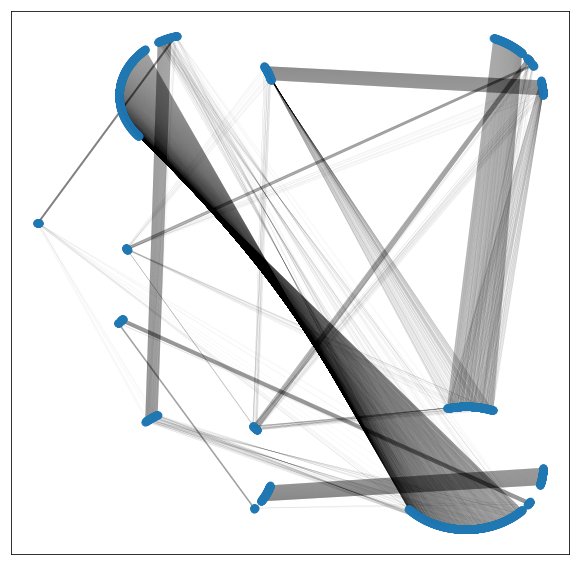

In [327]:
pos = nx.circular_layout(g)
buckets = [i for i in range(6)]

angs = np.linspace(0, 2*np.pi, 1+len(buckets))
repos = []
rad = 3.5     # radius of circle
for ea in angs:
    if ea > 0:
        #print(rad*np.cos(ea), rad*np.sin(ea))  # location of each cluster
        repos.append(np.array([rad*np.cos(ea), rad*np.sin(ea)]))

for ea in pos.keys():
    posx = 0
    if ea in node_map[0]:
        posx = 0
    elif ea in node_map[1]:
        posx = 1
    elif ea in node_map[2]:
        posx = 2
    elif ea in node_map[3]:
        posx = 3
    elif ea in node_map[4]:
        posx = 4
    else:
        pass
    pos[ea] += repos[posx]

plt.figure(figsize=(10,10))
nx.draw_networkx(g, pos=pos, width=0.1, alpha=0.2, with_labels=False, node_size=50)
plt.show()

###  Networked Graph with nodes as users and edges as common conspiracy theories

In [389]:
# Sample users so that the number of users in all conspiracy theories are equal

minusers = min([len(names) for names in users_list])
# minusers = 500
sample_freq = [len(names)/minusers  for names in users_list]
sampled_users = []
for i in range(len(users_list)):
    temp_list = list(users_list[i])
    sampled_consp_username = [temp_list[int(round(sample_freq[i]*j))] for j in range(len(temp_list)) if int(round(sample_freq[i]*j)) < len(temp_list)]
    sampled_users.append(sampled_consp_username)

print([len(i) for i in sampled_users])

[1070, 1070, 1070, 1070, 1070]


In [400]:
node_map = {}
g = nx.Graph()

for user_group in sampled_users:
    for i in range(len(user_group)):
        g.add_node(user_group[i])
        

for user_group in sampled_users:
    for i in range(len(user_group)):
        for j in range(len(user_group)):
            if i != j:
                g.add_edge(user_group[i], user_group[j])

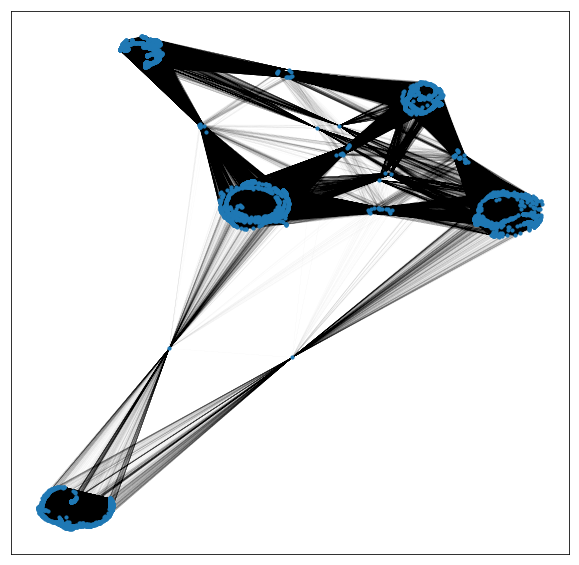

In [401]:
plt.figure(figsize=(10,10))
nx.draw_networkx(g, pos=None, width=0.01, with_labels=False, node_size=10)
plt.show()

In [38]:
# nx.clustering(g)

In [399]:
nx.degree_assortativity_coefficient(g)

-0.0006531806183054553

# Conspiracy tweet location data

In [245]:
import plotly.graph_objects as go

In [246]:
def plot_us_consp_map(df, specific_df,consp_str):
    loc_df = specific_df.dropna(subset=['location'])
    reg_loc_df = df.dropna(subset=['location'])

    consp_states = {} # no. of conpiracy tweets in each state
    reg_states = {} # no. of tweets in each state 
    consp_usernames = {} # dfs for hashtag analysis

    for state in tqdm(states):
        consp_usernames[us_state_abbrev[state]] = loc_df[loc_df.location.str.contains(state.lower())]
        consp_states[us_state_abbrev[state]] = len(loc_df[loc_df.location.str.contains(state.lower())])
        reg_states[us_state_abbrev[state]] = len(reg_loc_df[reg_loc_df.location.str.contains(state.lower())])

    state_props = dict(zip(list(consp_states.keys()), [x/y*100 for x, y in zip(list(consp_states.values()),list(reg_states.values()))]))
    
    fig = go.Figure(data=go.Choropleth(
    locations=list(state_props.keys()), # Spatial coordinates
    z = list(state_props.values()), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "%"))

    fig.update_layout(title_text='Percentage of tweets using '+consp_str+' keyword',geo_scope='usa')
    fig.show()
    
    return consp_states

In [247]:
states = ["Alabama","Alaska","Arizona","Arkansas","California","Colorado",
  "Connecticut","Delaware","Florida","Georgia","Hawaii","Idaho","Illinois",
  "Indiana","Iowa","Kansas","Kentucky","Louisiana","Maine","Maryland",
  "Massachusetts","Michigan","Minnesota","Mississippi","Missouri","Montana",
  "Nebraska","Nevada","New Hampshire","New Jersey","New Mexico","New York",
  "North Carolina","North Dakota","Ohio","Oklahoma","Oregon","Pennsylvania",
  "Rhode Island","South Carolina","South Dakota","Tennessee","Texas","Utah",
  "Vermont","Virginia","Washington","West Virginia","Wisconsin","Wyoming"]

us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

In [173]:
conspiracy_users_h, conspiracy_dict_h, consps_df_h = get_hashtags_tweets(df,keywords,cloud=clouds)
general_users_h, general_dict_h, general_consps_df_h = get_hashtags_tweets(df,general_keywords,cloud=clouds)
china_users_h, china_dict_h, china_df_h = get_hashtags_tweets(df,china_keywords,cloud=clouds)
bill_users_h, bill_dict_h, bill_df_h = get_hashtags_tweets(df,bill_keywords,cloud=clouds)
fiveg_users_h, fiveg_dict_h, fiveg_df_h = get_hashtags_tweets(df,fiveg_keywords,cloud=clouds)
hosp_users_h, hosp_dict_h, hosp_df_h = get_hashtags_tweets(df,hosp_keywords,cloud=clouds)
qanon_users_h, qanon_dict_h, qanon_df_h = get_hashtags_tweets(df,qanon_keywords,cloud=clouds)

KeyboardInterrupt: 

In [249]:
consp_states = plot_us_consp_map(df, consps_df_h,'all')
print(consp_states)

{'AL': 225, 'AK': 137, 'AZ': 488, 'AR': 99, 'CA': 1558, 'CO': 320, 'CT': 197, 'DE': 60, 'FL': 1388, 'GA': 420, 'HI': 109, 'ID': 155, 'IL': 278, 'IN': 305, 'IA': 84, 'KS': 232, 'KY': 190, 'LA': 206, 'ME': 84, 'MD': 149, 'MA': 196, 'MI': 539, 'MN': 209, 'MS': 105, 'MO': 250, 'MT': 96, 'NE': 61, 'NV': 107, 'NH': 60, 'NJ': 251, 'NM': 52, 'NY': 966, 'NC': 337, 'ND': 36, 'OH': 503, 'OK': 252, 'OR': 269, 'PA': 483, 'RI': 28, 'SC': 202, 'SD': 27, 'TN': 344, 'TX': 2216, 'UT': 81, 'VT': 23, 'VA': 308, 'WA': 611, 'WV': 47, 'WI': 189, 'WY': 28}


In [160]:
general_consp_states = plot_us_consp_map(df, general_consps_df_h,'general')
print(general_consp_states)

{'AL': 3, 'AK': 0, 'AZ': 11, 'AR': 3, 'CA': 46, 'CO': 14, 'CT': 21, 'DE': 1, 'FL': 55, 'GA': 8, 'HI': 1, 'ID': 1, 'IL': 9, 'IN': 6, 'IA': 0, 'KS': 5, 'KY': 8, 'LA': 2, 'ME': 0, 'MD': 10, 'MA': 3, 'MI': 11, 'MN': 20, 'MS': 1, 'MO': 4, 'MT': 1, 'NE': 5, 'NV': 6, 'NH': 1, 'NJ': 9, 'NM': 0, 'NY': 38, 'NC': 13, 'ND': 1, 'OH': 11, 'OK': 5, 'OR': 8, 'PA': 25, 'RI': 1, 'SC': 3, 'SD': 0, 'TN': 4, 'TX': 52, 'UT': 6, 'VT': 0, 'VA': 7, 'WA': 20, 'WV': 2, 'WI': 4, 'WY': 0}


In [174]:
china_consp_states = plot_us_consp_map(df, china_df_h,'china')
print(china_consp_states)

KeyboardInterrupt: 

In [163]:
bill_consp_states = plot_us_consp_map(df, bill_df_h,'bill')
print(bill_consp_states)

{'AL': 6, 'AK': 0, 'AZ': 3, 'AR': 1, 'CA': 28, 'CO': 4, 'CT': 1, 'DE': 0, 'FL': 15, 'GA': 6, 'HI': 11, 'ID': 4, 'IL': 0, 'IN': 1, 'IA': 0, 'KS': 3, 'KY': 3, 'LA': 0, 'ME': 1, 'MD': 2, 'MA': 2, 'MI': 8, 'MN': 4, 'MS': 0, 'MO': 3, 'MT': 0, 'NE': 0, 'NV': 0, 'NH': 0, 'NJ': 7, 'NM': 0, 'NY': 55, 'NC': 6, 'ND': 0, 'OH': 4, 'OK': 2, 'OR': 9, 'PA': 9, 'RI': 0, 'SC': 1, 'SD': 0, 'TN': 8, 'TX': 37, 'UT': 1, 'VT': 0, 'VA': 7, 'WA': 4, 'WV': 0, 'WI': 0, 'WY': 0}


In [164]:
fiveg_consp_states = plot_us_consp_map(df, fiveg_df_h,'fiveg')
print(fiveg_consp_states)

{'AL': 1, 'AK': 1, 'AZ': 1, 'AR': 0, 'CA': 15, 'CO': 0, 'CT': 0, 'DE': 0, 'FL': 15, 'GA': 1, 'HI': 0, 'ID': 0, 'IL': 0, 'IN': 1, 'IA': 0, 'KS': 0, 'KY': 1, 'LA': 0, 'ME': 0, 'MD': 2, 'MA': 1, 'MI': 1, 'MN': 1, 'MS': 0, 'MO': 0, 'MT': 0, 'NE': 0, 'NV': 0, 'NH': 0, 'NJ': 2, 'NM': 0, 'NY': 9, 'NC': 0, 'ND': 0, 'OH': 1, 'OK': 1, 'OR': 0, 'PA': 0, 'RI': 0, 'SC': 0, 'SD': 0, 'TN': 0, 'TX': 1, 'UT': 0, 'VT': 0, 'VA': 0, 'WA': 1, 'WV': 0, 'WI': 0, 'WY': 0}


In [165]:
hosp_consp_states = plot_us_consp_map(df, hosp_df_h,'hosp')
print(hosp_consp_states)

{'AL': 10, 'AK': 2, 'AZ': 14, 'AR': 4, 'CA': 69, 'CO': 17, 'CT': 8, 'DE': 1, 'FL': 71, 'GA': 13, 'HI': 4, 'ID': 6, 'IL': 13, 'IN': 4, 'IA': 2, 'KS': 10, 'KY': 4, 'LA': 6, 'ME': 2, 'MD': 5, 'MA': 1, 'MI': 18, 'MN': 11, 'MS': 4, 'MO': 7, 'MT': 2, 'NE': 0, 'NV': 4, 'NH': 3, 'NJ': 7, 'NM': 2, 'NY': 43, 'NC': 17, 'ND': 1, 'OH': 17, 'OK': 3, 'OR': 7, 'PA': 24, 'RI': 0, 'SC': 3, 'SD': 1, 'TN': 15, 'TX': 100, 'UT': 1, 'VT': 2, 'VA': 11, 'WA': 18, 'WV': 2, 'WI': 8, 'WY': 1}


In [166]:
qanon_consp_states = plot_us_consp_map(df, qanon_df_h,'qanon')
print(qanon_consp_states)

{'AL': 180, 'AK': 87, 'AZ': 243, 'AR': 59, 'CA': 691, 'CO': 222, 'CT': 131, 'DE': 20, 'FL': 716, 'GA': 244, 'HI': 38, 'ID': 93, 'IL': 150, 'IN': 192, 'IA': 33, 'KS': 124, 'KY': 122, 'LA': 184, 'ME': 50, 'MD': 54, 'MA': 115, 'MI': 319, 'MN': 97, 'MS': 56, 'MO': 126, 'MT': 69, 'NE': 14, 'NV': 47, 'NH': 64, 'NJ': 89, 'NM': 36, 'NY': 293, 'NC': 175, 'ND': 18, 'OH': 307, 'OK': 171, 'OR': 115, 'PA': 236, 'RI': 20, 'SC': 120, 'SD': 22, 'TN': 223, 'TX': 1231, 'UT': 54, 'VT': 9, 'VA': 138, 'WA': 285, 'WV': 27, 'WI': 113, 'WY': 18}


In [ ]:
general_loc_df = general_consps_df_h.dropna(subset=['location'])
reg_loc_df = df.dropna(subset=['location'])

consp_states = {} # no. of conpiracy tweets in each state
reg_states = {} # no. of tweets in each state 
consp_usernames = {} # dfs for hashtag analysis

for state in tqdm(states):
    consp_usernames[us_state_abbrev[state]] = general_loc_df[general_loc_df.location.str.contains(state.lower())]
    consp_states[us_state_abbrev[state]] = len(general_loc_df[general_loc_df.location.str.contains(state.lower())])
    reg_states[us_state_abbrev[state]] = len(reg_loc_df[reg_loc_df.location.str.contains(state.lower())])

state_props = dict(zip(list(consp_states.keys()), [x/y*100 for x, y in zip(list(consp_states.values()),list(reg_states.values()))]))
    
print(consp_states)

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Choropleth(
    locations=list(state_props.keys()), # Spatial coordinates
    z = list(state_props.values()), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "%"))

fig.update_layout(title_text='Percentage of tweets using qanon keyword',geo_scope='usa')

fig.show()

In [149]:
qanon_users_h, qanon_dict_h, qanon_df_h = get_hashtags_tweets(df,qanon_keywords,cloud=clouds)
qanon_loc_df = qanon_df_h.dropna(subset=['location'])
reg_loc_df = df.dropna(subset=['location'])

consp_states = {} # no. of conpiracy tweets in each state
reg_states = {} # no. of tweets in each state 
consp_usernames = {} # dfs for hashtag analysis

for state in tqdm(states):
    consp_usernames[us_state_abbrev[state]] = qanon_loc_df[qanon_loc_df.location.str.contains(state.lower())]
    consp_states[us_state_abbrev[state]] = len(qanon_loc_df[qanon_loc_df.location.str.contains(state.lower())])
    reg_states[us_state_abbrev[state]] = len(reg_loc_df[reg_loc_df.location.str.contains(state.lower())])

state_props = dict(zip(list(consp_states.keys()), [x/y*100 for x, y in zip(list(consp_states.values()),list(reg_states.values()))]))
    
print(consp_states)

In [152]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Choropleth(
    locations=list(state_props.keys()), # Spatial coordinates
    z = list(state_props.values()), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "%"))

fig.update_layout(title_text='Percentage of tweets using qanon keyword',geo_scope='usa')

fig.show()

In [ ]:
qanon_users_h, qanon_dict_h, qanon_df_h = get_hashtags_tweets(df,qanon_keywords,cloud=clouds)

qanon_loc_df = qanon_df_h.dropna(subset=['location'])
reg_loc_df = df.dropna(subset=['location'])

consp_states = {} # no. of conpiracy tweets in each state
reg_states = {} # no. of tweets in each state 
consp_usernames = {} # dfs for hashtag analysis

for state in tqdm(states):
    consp_usernames[us_state_abbrev[state]] = qanon_loc_df[qanon_loc_df.location.str.contains(state.lower())]
    consp_states[us_state_abbrev[state]] = len(qanon_loc_df[qanon_loc_df.location.str.contains(state.lower())])
    reg_states[us_state_abbrev[state]] = len(reg_loc_df[reg_loc_df.location.str.contains(state.lower())])

state_props = dict(zip(list(consp_states.keys()), [x/y*100 for x, y in zip(list(consp_states.values()),list(reg_states.values()))]))
    
print(consp_states)

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Choropleth(
    locations=list(state_props.keys()), # Spatial coordinates
    z = list(state_props.values()), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "%"))

fig.update_layout(title_text='Percentage of tweets using qanon keyword',geo_scope='usa')

fig.show()

# N Grams analysis

In [211]:
print('Conspiracy tweets')
ngram_counts = Counter(ngrams(all_consp_text.split(), 2))
ngram_counts.most_common(10)

Conspiracy tweets


[(('#qanon', '#wwg1wga'), 49),
 (('about', 'coronavirus.'), 37),
 (('@sun_q_tzu:', 'brilliant'), 36),
 (('brilliant', 'clip'), 36),
 (('clip', 'from'), 36),
 (('from', 'drew!'), 36),
 (('drew!', 'nails'), 36),
 (('nails', 'fakenews'), 36),
 (('fakenews', 'overreacting'), 36),
 (('overreacting', 'about'), 36)]

In [212]:
ngram_counts = Counter(ngrams(all_consp_text.split(), 3))
ngram_counts.most_common(10)

[(('@sun_q_tzu:', 'brilliant', 'clip'), 36),
 (('brilliant', 'clip', 'from'), 36),
 (('clip', 'from', 'drew!'), 36),
 (('from', 'drew!', 'nails'), 36),
 (('drew!', 'nails', 'fakenews'), 36),
 (('nails', 'fakenews', 'overreacting'), 36),
 (('fakenews', 'overreacting', 'about'), 36),
 (('overreacting', 'about', 'coronavirus.'), 36),
 (('about', 'coronavirus.', 'click'), 36),
 (('coronavirus.', 'click', 'clip'), 36)]